# Section 1: Library Importations

This section doesn't contain any executable code, it imports statements for various libraries and modules that are commonly used in data analysis, computer vision, data visualization, and image processing tasks.

In [82]:
# Import necessary libraries or modules
import os                  # Operating system interface for file and directory operations
import cv2                 # OpenCV - Library for computer vision tasks
import numpy as np         # NumPy - Library for numerical computations
import pandas as pd        # Pandas - Library for data manipulation and analysis
import matplotlib.pyplot as plt    # Matplotlib - Library for data visualization
import seaborn as sns      # Seaborn - Library for advanced data visualization
import random              # Library for generating random numbers
import PIL                  # Python Imaging Library for image processing
from PIL import Image      # PIL - Python Imaging Library for working with images
from colorthief import ColorThief  # ColorThief - Library for extracting color palettes from images
from sklearn.cluster import KMeans # Importing the KMeans clustering algorithm from sklearn
import io                   # The io module provides core tools for working with streams in a generic way.
import tensorflow as tf    # TensorFlow for deep learning
from tensorflow import keras  # Keras API from TensorFlow for building deep learning models
from sklearn.metrics import silhouette_score  # Silhouette score metric from scikit-learn
import glob, shutil         # glob for file matching, shutil for file handling
from tensorflow.keras import layers  # Keras layers module from TensorFlow for model building
from tensorflow.keras.models import Sequential  # Keras Sequential model from TensorFlow for model building
import pathlib              # pathlib for handling file paths
import json                 # JSON for working with JSON data
import time                 # Time for measuring elapsed time in code execution
from tensorflow.keras.layers import Dense, Reshape, Conv2D, Flatten  # Additional Keras layers for model building
from tensorflow.keras.losses import BinaryCrossentropy              # Binary Crossentropy loss function
from keras.layers import Input, Concatenate  # Keras Input and Concatenate layers
from keras.models import Model  # Keras Model for creating custom models
from tensorflow.keras.applications import InceptionV3  # InceptionV3 pre-trained model for image classification
from scipy.linalg import sqrtm  # Square root function from SciPy.linalg
from tensorflow.keras import layers, models, optimizers  # Import the optimizers module here
from tensorflow.keras.applications.inception_v3 import InceptionV3 # InceptionV3 pre-trained model for image classification
from scipy import linalg  # Import the 'linalg' module from the 'scipy' library.
from scipy import ndimage # Import the 'ndimage' module from the 'scipy' library.
from scipy.stats import entropy       # Import the entropy function from the scipy.stats module
from sklearn.preprocessing import label_binarize   # Import the label_binarize function from the sklearn.preprocessing module
from tqdm import tqdm     # Import the tqdm function for creating progress bars
from tensorflow.keras.applications.inception_v3 import preprocess_input  # Import the preprocess_input function from TensorFlow/Keras
from skimage.metrics import structural_similarity as compare_ssim  # Import the structural_similarity function from skimage.metrics

# Section 2: Exploratory Data Analysis on Fashion Images

The code block in this section analyzes the collection of large fashion images to obtain important statistics related to their sizes. It defines the path to the folder containing the images and uses the necessary libraries for image processing, data manipulation, and visualization. Then, counts the number of images in the fashion dataset.

The code defines a function get_image_size to calculate the width and height of an image using the OpenCV library. 

Next, it iterates through the image files in the folder, excluding non-image files, and gathers their respective sizes by calling the get_image_size function and storing the results in a list. This list of image sizes is then converted into a NumPy array to facilitate further computations. 

The code further calculates summary statistics, including the mean, median, minimum, and maximum width and height of the images, and show their results. 

Additionally, it creates a histogram plot using Matplotlib, showcasing the distribution of image widths and heights. The resulting visualizations and statistics provide valuable insights into the dimensions of the fashion images that will be used for building the GAN model to develop new wristwatch designs, aiding in image analysis and understanding their characteristics.

In [2]:
# Path to the images folder
images_folder = '/home/718764/Downloads/fashion-dataset/images/'

In [3]:
# Defining a function to count images in a folder
def count_images_in_folder(folder_path):
    # List of image file extensions
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']

    # Initializing the image count
    image_count = 0
    
    # Looping through each filename in the specified folder
    for filename in os.listdir(folder_path):
        # Extracting the file extension and converting it to lowercase
        file_extension = os.path.splitext(filename)[1].lower()

        # Checking if the file extension is in the list of image extensions
        if file_extension in image_extensions:
            image_count += 1  # Incrementing the image count

    return image_count


# Calling the function to count the number of images in the folder
number_of_images = count_images_in_folder(images_folder)

# Printing the result
print("Number of images in the folder:", number_of_images)

Number of images in the folder: 44441


In [5]:
 # Defining a function to get image sizes
def get_image_size(image_path):
    # Reading the images from the specified path
    image = cv2.imread(image_path)
    # Getting the dimensions of the images (width, height, and number of channels)
    height, width, _ = image.shape
    # Returning the width and height of the images
    return width, height

In [6]:
# Creating an empty list to store image sizes
image_sizes = []

# List of image extensions to check
image_extensions = ['.jpg', '.jpeg', '.png', '.gif']

# Looping through each filename in the specified images folder
for filename in os.listdir(images_folder):
    if any(filename.lower().endswith(ext) for ext in image_extensions):
        # Checking if the file has one of the specified image extensions
        image_path = os.path.join(images_folder, filename)  # Creating the full path of the image
        width, height = get_image_size(image_path)  # Calling the function to calculate the width and height of the image
        image_sizes.append((width, height))  # Appending the image size as a tuple (width, height) to the list

In [7]:
# Convert image sizes to numpy array
image_sizes = np.array(image_sizes)

# Calculate summary statistics
size_mean = np.mean(image_sizes, axis=0)  # Calculate mean width and height
size_median = np.median(image_sizes, axis=0)  # Calculate median width and height
size_min = np.min(image_sizes, axis=0)  # Calculate minimum width and height
size_max = np.max(image_sizes, axis=0)  # Calculate maximum width and height

In [8]:
# Print summary statistics of image sizes.
print('Image Size Summary Statistics:')

# Print the mean width and height of the images.
print('Mean Width:', size_mean[0])
print('Mean Height:', size_mean[1])

# Print the median width and height of the images.
print('Median Width:', size_median[0])
print('Median Height:', size_median[1])

# Print the minimum width and height of the images.
print('Minimum Width:', size_min[0])
print('Minimum Height:', size_min[1])

# Print the maximum width and height of the images.
print('Maximum Width:', size_max[0])
print('Maximum Height:', size_max[1])

Image Size Summary Statistics:
Mean Width: 1397.1412209446232
Mean Height: 1862.8735176976215
Median Width: 1080.0
Median Height: 1440.0
Minimum Width: 150
Minimum Height: 200
Maximum Width: 3744
Maximum Height: 5616


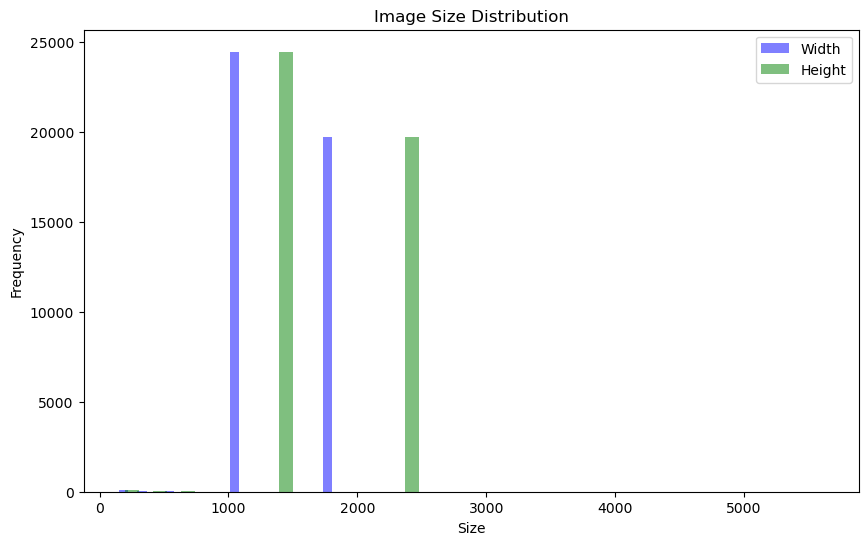

In [9]:
# Visualize images size distribution
plt.figure(figsize=(10, 6))  # Set the size of the plot
plt.hist(image_sizes[:, 0], bins=50, alpha=0.5, color='blue', label='Width')  # Plot histogram for image widths
plt.hist(image_sizes[:, 1], bins=50, alpha=0.5, color='green', label='Height')  # Plot histogram for image heights
plt.xlabel('Size')  # Label for x-axis
plt.ylabel('Frequency')  # Label for y-axis
plt.title('Image Size Distribution')  # Title of the plot
plt.legend()  # Show legend
plt.show()  # Display the plot

# Section 3: Examining supplementary folders housing additional attributes within the fashion dataset.

This section reads data from csv files into DataFrames and display sample images from the image folder for visualization.

The code block in this section reads data from the CSV files containing fashion-related information. It first attempts to read a file named "styles.csv" into the styles_df DataFrame. If there is a parsing error, it tries to read the same file again, ignoring any bad lines that may be causing the issue. 

Next, it reads data from "images.csv" into the images_df DataFrame. The code then displays 20 randomly sampled images from the dataset in a row using matplotlib. 

In [10]:
# Trying to read data from 'styles.csv' into the DataFrame styles_df
try:
    styles_df = pd.read_csv('/home/718764/Downloads/fashion-dataset/styles.csv')
except pd.errors.ParserError:  # Handling parsing errors using an exception
    # If there's a parsing error, read the CSV again while skipping bad lines
    styles_df = pd.read_csv('/home/718764/Downloads/fashion-dataset/styles.csv', on_bad_lines='skip')

# Reading data from 'images.csv' into the DataFrame images_df
images_df = pd.read_csv('/home/718764/Downloads/fashion-dataset/images.csv')

In [11]:
# Sample 20 random images from images_df and store them in sample_images variable. 
#'n' represents the number of samples to display.
sample_images = images_df.sample(n=20)

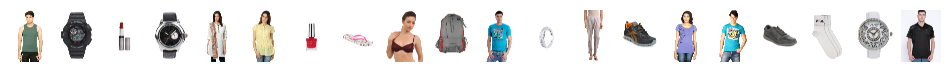

In [12]:
# Create a figure with a row of subplots to display the sampled images. Each subplot will have a size of (12, 4).
fig, axes = plt.subplots(1, len(sample_images), figsize=(12, 4))

# Iterate through the sampled images and display each image on a separate subplot.
for i, (index, image_row) in enumerate(sample_images.iterrows()):
    filename = image_row['filename']  # Get the filename from the 'filename' column of the current row.
    image_path = os.path.join('/home/718764/Downloads/fashion-dataset/images', filename)  # Create the full image path using the images folder and the filename.
    image = Image.open(image_path)  # Open the image using the PIL library.
    axes[i].imshow(image)  # Display the image on the current subplot.
    axes[i].axis('off')  # Turn off axis ticks and labels for better visualization.

# Show the figure containing the sampled images.
plt.show()

In [13]:
# Performing basic EDA on styles.csv data
styles_df.head()  # Display the first few rows of the styles dataframe

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt


In [14]:
# Count the number of non-null values in `each column of the DataFrame styles_df and display the result.
styles_df.count()

id                    44424
gender                44424
masterCategory        44424
subCategory           44424
articleType           44424
baseColour            44409
season                44403
year                  44423
usage                 44107
productDisplayName    44417
dtype: int64

In [15]:
# Drop rows with missing values (NaN) from the DataFrame 'styles_df'
styles_df.dropna(inplace=True)

In [16]:
#confirm if change has been made
styles_df.count()

id                    44077
gender                44077
masterCategory        44077
subCategory           44077
articleType           44077
baseColour            44077
season                44077
year                  44077
usage                 44077
productDisplayName    44077
dtype: int64

# Section 4: Analyzing the distinct attributes within the styles dataframe

This section creates visualizations for different attributes of the style dataframe.

The code blocks shows a series of graph plots using seaborn to visualize the distribution of various attributes in the fashion dataset, including gender, master category, sub-category, top article types, top base colors, season, and year. These visualizations provide valuable insights into the fashion dataset, aiding in better understanding and analysis of the data.

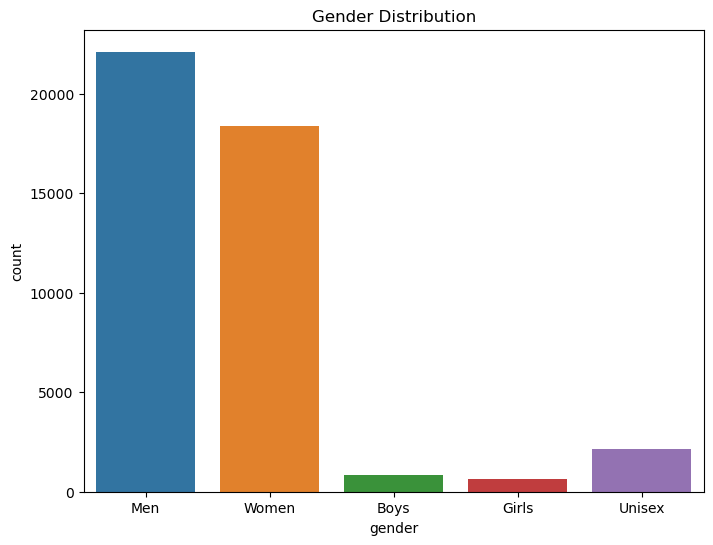

In [17]:
# Create a count plot graph to visualize the distribution of 'gender' attributes in styles_df.

# Create a new figure with a size of (8, 6) to display the count plot of the 'gender' column from the DataFrame styles_df.
plt.figure(figsize=(8, 6))

# Use seaborn's countplot function to plot the count distribution of 'gender' column from the DataFrame styles_df.
sns.countplot(data=styles_df, x='gender')

# Set the title of the plot as 'Gender Distribution'
plt.title('Gender Distribution')

# Display the plot
plt.show()

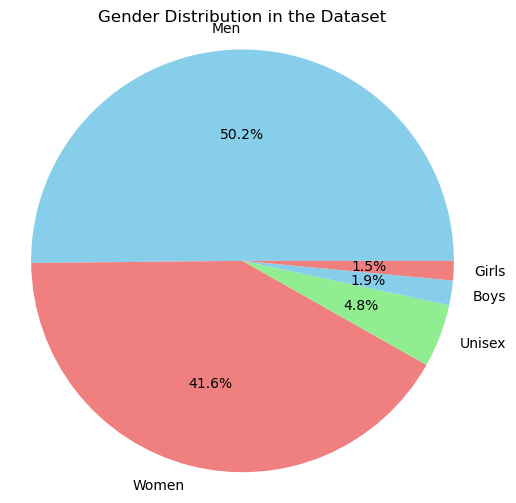

In [18]:
# Calculating the counts of different genders in the 'gender' column of styles_df DataFrame
gender_counts = styles_df['gender'].value_counts()

# Creating a pie chart to visualize gender distribution
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral', 'lightgreen'])
plt.title('Gender Distribution in the Dataset')
plt.axis('equal')  # Ensuring the pie chart is circular
plt.show()  # Displaying the chart

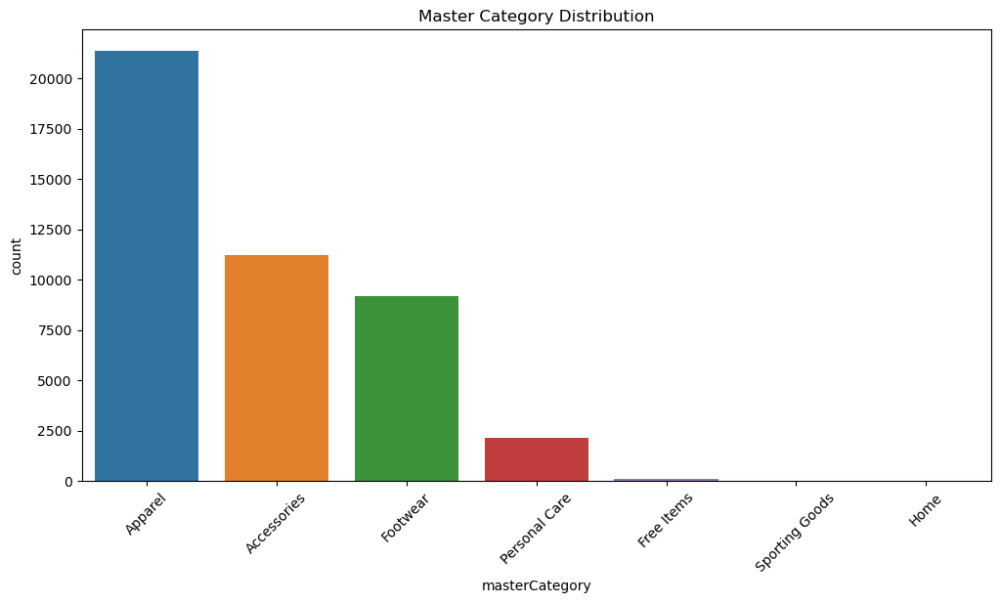

In [19]:
# Create a count plot to visualize the distribution of 'masterCategory' attribute in styles_df. 
# I rotated the x-axis labels for better readability.

# Create a new figure with a size of (12, 6) to display the count plot of the 'masterCategory' column from the DataFrame styles_df.
plt.figure(figsize=(12, 6))

# Use seaborn's countplot function to plot the count distribution of 'masterCategory' column from the DataFrame styles_df.
sns.countplot(data=styles_df, x='masterCategory')

# Set the title of the plot as 'Master Category Distribution'.
plt.title('Master Category Distribution')

# Rotate the x-axis tick labels by 45 degrees for better readability.
plt.xticks(rotation=45)

# Display the plot.
plt.show()

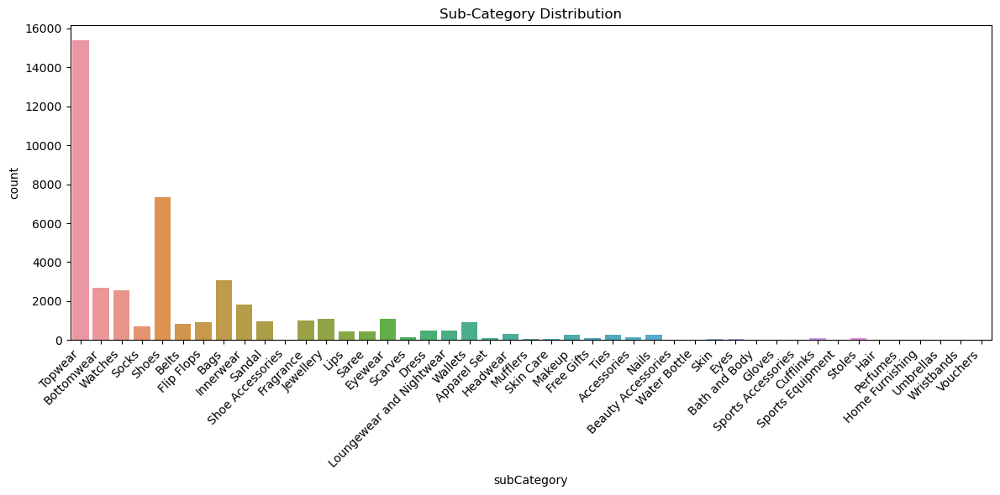

In [20]:
# Create a count plot to visualize the distribution of 'subCategory' attribute in styles_df. 
#I rotated x-axis labels and adjusted layout for better readability.

# Create a new figure with a size of (12, 6) to display the count plot of the 'subCategory' column from the DataFrame styles_df.
plt.figure(figsize=(12, 6))

# Using seaborn's countplot function to plot the count distribution of 'subCategory' column from the DataFrame styles_df.
ax = sns.countplot(data=styles_df, x='subCategory')

# Set the title of the plot as 'Sub-Category Distribution'.
plt.title('Sub-Category Distribution')

# Rotate the x-axis tick labels by 45 degrees and align them to the right for better readability.
plt.xticks(rotation=45, ha='right')

# Adjust the layout of the plot to prevent overlapping of labels and elements.
plt.tight_layout()

# Display the plot.
plt.show()

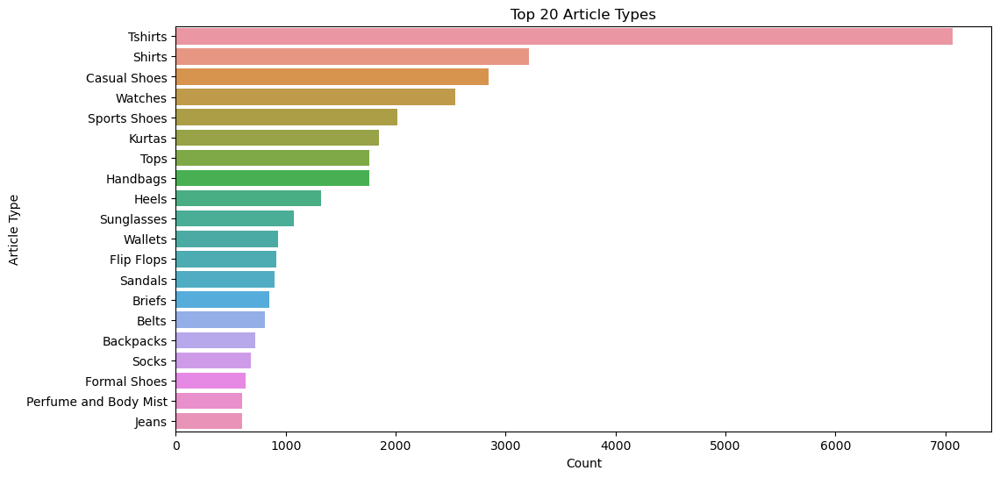

In [21]:
# Create a count plot to visualize the top 20 'articleType' values in styles_df. Order the bars by count.

# Create a new figure with a size of (12, 6) to display the count plot of the 'articleType' column from the DataFrame styles_df.
# The order of the bars in the plot is specified by the top 20 most frequent 'articleType' values.
plt.figure(figsize=(12, 6))
sns.countplot(data=styles_df, y='articleType', order=styles_df['articleType'].value_counts().index[:20])

# Set the title of the plot as 'Top 20 Article Types'.
plt.title('Top 20 Article Types')

# Label the y-axis as 'Article Type'.
plt.ylabel('Article Type')

# Label the x-axis as 'Count'.
plt.xlabel('Count')

# Display the plot.
plt.show()

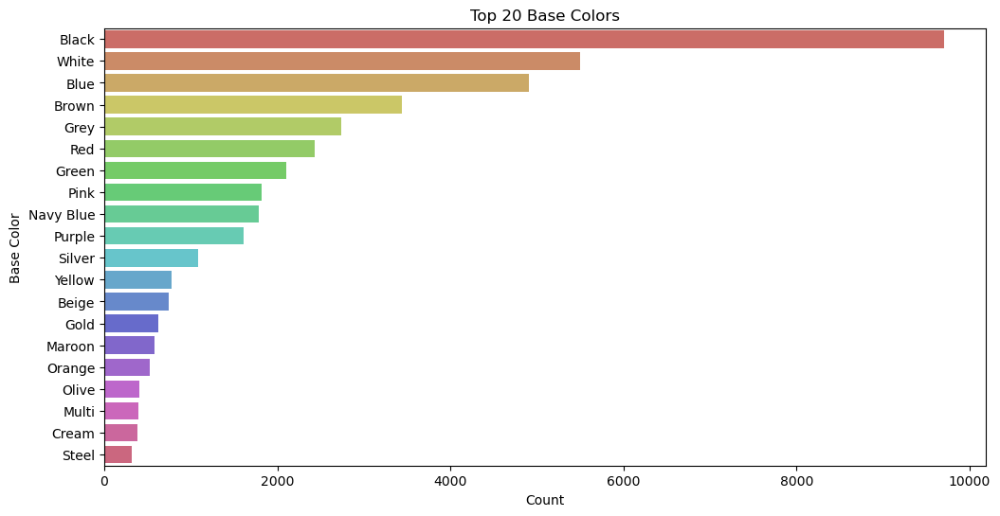

In [22]:
# Get the top 20 'baseColour' values in styles_df and store them in top_base_colors.
top_base_colors = styles_df['baseColour'].value_counts().index[:20]

# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the top base colors
sns.countplot(data=styles_df, y='baseColour', order=top_base_colors, palette=sns.color_palette('hls', len(top_base_colors)))

# Adding a title to the plot
plt.title('Top 20 Base Colors')

# Adding labels to the y-axis and x-axis
plt.ylabel('Base Color')
plt.xlabel('Count')

# Displaying the plot
plt.show()

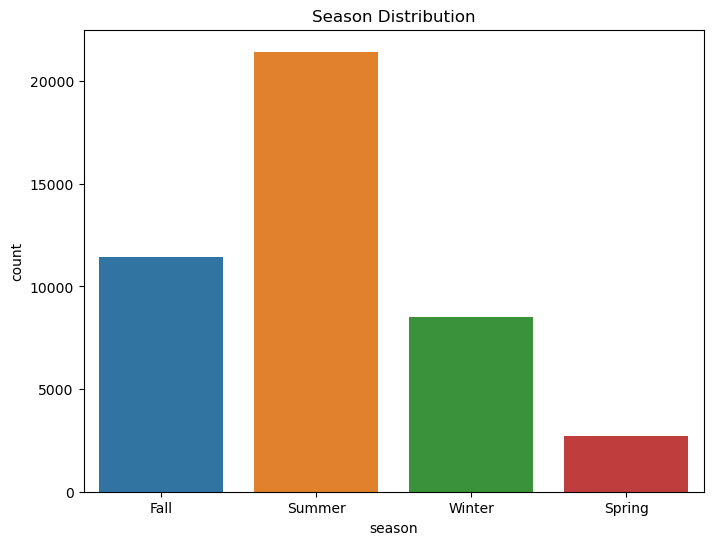

In [23]:
# Create a count plot to visualize the distribution of 'season' attribute in styles_df.

# Create a new figure with a size of (8, 6) to display the count plot of the 'season' column from the DataFrame styles_df.
plt.figure(figsize=(8, 6))

# Use seaborn's countplot function to plot the count distribution of 'season' column from the DataFrame styles_df.
sns.countplot(data=styles_df, x='season')

# Set the title of the plot as 'Season Distribution'.
plt.title('Season Distribution')

# Display the plot.
plt.show()

# Section 5: Conducting exploratory data analysis on the Categories dataset

This code segment demonstrates particular item categories by filtering and sampling images from their corresponding subcategories.

Sampling images from the Footware category and displaying them

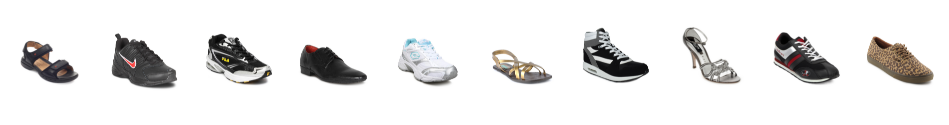

In [24]:
# Filter the DataFrame styles_df to only include rows where masterCategory is 'Footwear' and subCategory is 'Shoes', and assign it to shoes_df.
shoes_df = styles_df[(styles_df['masterCategory'] == 'Footwear') & (styles_df['subCategory'] == 'Shoes')]

# Define the number of sample images to display as num_samples.
num_samples = 10

# Sample num_samples randomly from shoes_df and store them in sample_images.
sample_images = shoes_df.sample(n=num_samples)

# Create a figure with a row of subplots to display the sampled shoe images. Each subplot will have a size of (12, 4).
fig, axes = plt.subplots(1, num_samples, figsize=(12, 4))

# Iterate through the sampled shoe images and display each image on a separate subplot.
for i, (_, row) in enumerate(sample_images.iterrows()):
    filename = str(row['id']) + '.jpg'  # Get the filename by concatenating the 'id' column value with '.jpg'.
    image_path = os.path.join(images_folder, filename)  # Create the full image path using images_folder and filename.
    image = Image.open(image_path)  # Open the image using the PIL library.
    axes[i].imshow(image)  # Display the image on the subplot.
    axes[i].axis('off')  # Turn off axis ticks and labels for better visualization.

# Show the figure containing the sampled shoe images.
plt.show()

Sampling images from the 'Topwear' subcategory and displaying them.

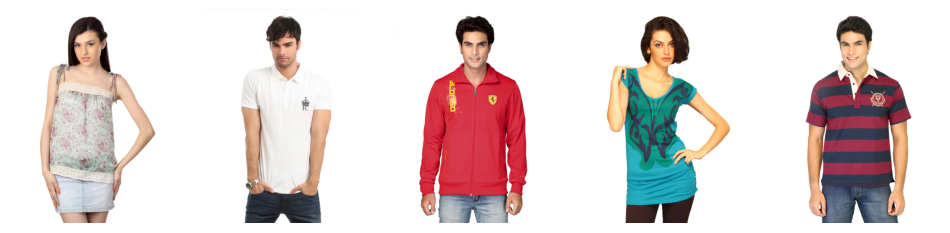

In [25]:
# Filter the DataFrame styles_df to only include rows where masterCategory is 'Apparel' and subCategory is 'Topwear', and assign it to tops_df.
tops_df = styles_df[(styles_df['masterCategory'] == 'Apparel') & (styles_df['subCategory'] == 'Topwear')]

# Define the number of sample images to display as num_samples.
num_samples = 5

# Sample num_samples randomly from tops_df and store them in sample_images.
sample_images = tops_df.sample(n=num_samples)

# Create a figure with a row of subplots to display the sampled topwear images. Each subplot will have a size of (12, 4).
fig, axes = plt.subplots(1, num_samples, figsize=(12, 4))

# Iterate through the sampled topwear images and display each image on a separate subplot.
for i, (_, row) in enumerate(sample_images.iterrows()):
    filename = str(row['id']) + '.jpg'  # Get the filename by concatenating the 'id' column value with '.jpg'.
    image_path = os.path.join(images_folder, filename)  # Create the full image path using images_folder and filename.
    image = Image.open(image_path)  # Open the image using the PIL library.
    axes[i].imshow(image)  # Display the image on the subplot.
    axes[i].axis('off')  # Turn off axis ticks and labels for better visualization.

# Show the figure containing the sampled topwear images.
plt.show()

Sampling images from the 'Bags' subcategory and displaying them.

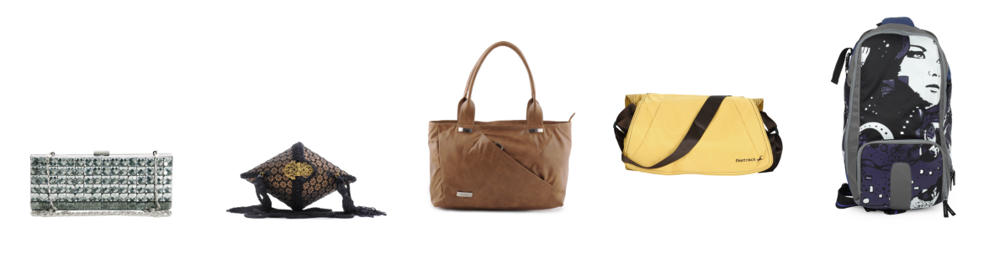

In [26]:
# Filter the DataFrame styles_df to only include rows where subCategory is 'Bags', and assign it to bags_df.
bags_df = styles_df[styles_df['subCategory'] == 'Bags']

# Define the number of sample images to display as num_samples.
num_samples = 5

# Create a figure with a row of subplots to display the sampled bag images. Each subplot will have a size of (12, 4).
fig, axes = plt.subplots(1, num_samples, figsize=(12, 4))

# Iterate through num_samples and randomly select a bag image to display on each subplot.
for i in range(num_samples):
    random_index = random.choice(bags_df.index)  # Get a random index from the bags_df DataFrame.
    row = bags_df.loc[random_index]  # Retrieve the row corresponding to the random index.
    
    filename = str(row['id']) + '.jpg'  # Get the filename by concatenating the 'id' column value with '.jpg'.
    image_path = os.path.join(images_folder, filename)  # Create the full image path using images_folder and filename.
    
    image = Image.open(image_path)  # Open the image using the PIL library.
    axes[i].imshow(image)  # Display the image on the subplot.
    axes[i].axis('off')  # Turn off axis ticks and labels for better visualization.

# Adjust the layout of subplots and show the figure containing the sampled bag images.
plt.tight_layout()
plt.show()

Sampling images from the 'Wristwatches' subcategory and displaying them

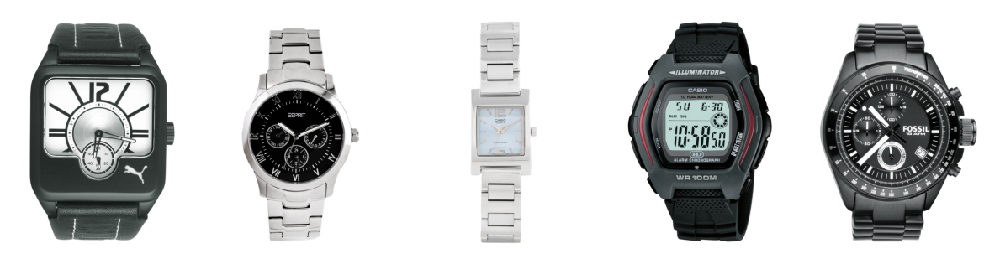

In [27]:
# Filter the DataFrame styles_df to only include rows where subCategory is 'Watches', and assign it to watches_df.
watches_df = styles_df[styles_df['subCategory'] == 'Watches']

# Define the number of sample images to display as num_samples.
num_samples = 5

# Create a figure with a row of subplots to display the sampled watch images. Each subplot will have a size of (12, 4).
fig, axes = plt.subplots(1, num_samples, figsize=(12, 4))

# Iterate through num_samples and randomly select a watch image to display on each subplot.
for i in range(num_samples):
    random_index = random.choice(watches_df.index)  # Get a random index from the watches_df DataFrame.
    row = watches_df.loc[random_index]  # Retrieve the row corresponding to the random index.
    
    filename = str(row['id']) + '.jpg'  # Get the filename by concatenating the 'id' column value with '.jpg'.
    image_path = os.path.join(images_folder, filename)  # Create the full image path using images_folder and filename.
    
    image = Image.open(image_path)  # Open the image using the PIL library.
    axes[i].imshow(image)  # Display the image on the subplot.
    axes[i].axis('off')  # Turn off axis ticks and labels for better visualization.

# Adjust the layout of subplots and show the figure containing the sampled watch images.
plt.tight_layout()
plt.show()

# Section 6: Exploring the overall fashion items

This section visualizes random samples from multiple fashion items such as Topwear Shoes, Watches, Bags, Bottomwear, Socks, Saree and more

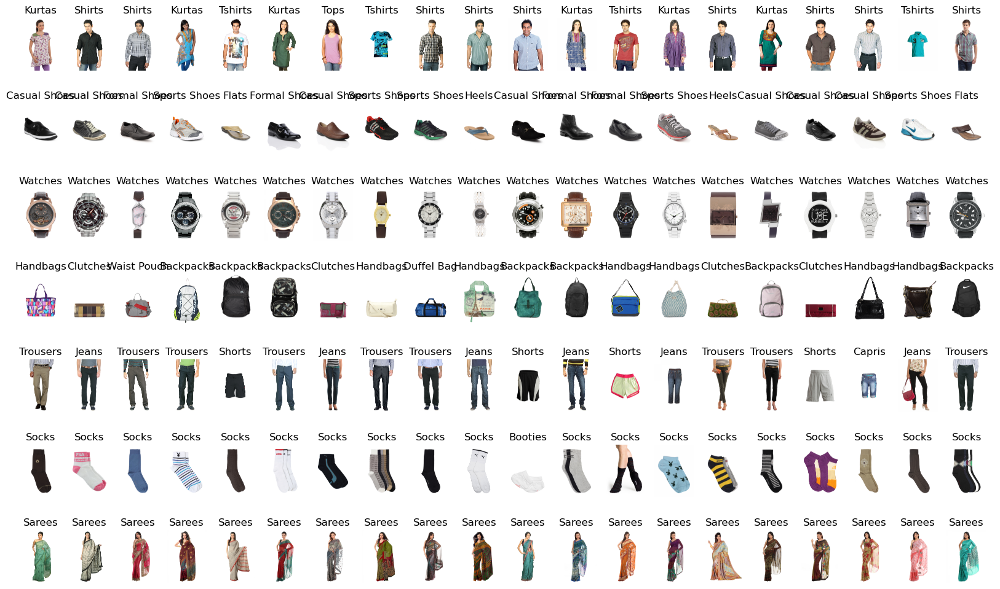

In [28]:
# List of categories for which sample images will be displayed.
categories = ['Topwear', 'Shoes', 'Watches', 'Bags', 'Bottomwear', 'Socks', 'Saree']

# Define the number of sample images to display as num_samples.
num_samples = 20

# Create a figure with a grid of subplots to display the sampled images from different categories. The grid size will be determined by the number of categories and num_samples. Each subplot will have a size of (16, 10).
fig, axes = plt.subplots(len(categories), num_samples, figsize=(16, 10))

# Iterate through each category and display num_samples sampled images from that category on separate subplots.
for i, category in enumerate(categories):
    category_df = styles_df[styles_df['subCategory'] == category]  # Filter styles_df to only include rows with the current category.
    
    category_samples = category_df.sample(n=num_samples)  # Sample num_samples from the current category DataFrame.
    
    for j, (_, row) in enumerate(category_samples.iterrows()):
        filename = str(row['id']) + '.jpg'  # Get the filename by concatenating the 'id' column value with '.jpg'.
        image_path = os.path.join(images_folder, filename)  # Create the full image path using images_folder and filename.
        image = Image.open(image_path)  # Open the image using the PIL library.
        axes[i, j].imshow(image)  # Display the image on the current subplot.
        axes[i, j].axis('off')  # Turn off axis ticks and labels for better visualization.
        axes[i, j].set_title(row['articleType'])  # Set the subplot title to the 'articleType' value.

# Adjust the layout of subplots and show the figure containing the sampled images from different categories.
plt.tight_layout()
plt.show()

# Section 7: Extracting WristWatch Images

This section extracts wristwatch images from the large fashion image dataset that will be used to produce new wristwatch designs in the GAN implementation for this research work

In [29]:
# Specifying the path for the watch images folder
watch_images_folder = '/home/718764/Downloads/fashion-dataset/wristwatch_images'

# Creating the folder if it doesn't exist, and ensuring no error if it already exists
os.makedirs(watch_images_folder, exist_ok=True)

In [30]:
# Filtering the styles DataFrame to select watch-related data
watch_df = styles_df[(styles_df['masterCategory'] == 'Accessories') & 
                     (styles_df['subCategory'] == 'Watches') &
                     (styles_df['articleType'] == 'Watches')]

# Creating a list of filenames for watch images
watch_image_filenames = watch_df['id'].astype(str) + '.jpg'

# Looping through each filename in the list
for filename in watch_image_filenames:
    # Creating the source and destination paths for image copying
    src_path = os.path.join('/home/718764/Downloads/fashion-dataset/images/', filename)  
    dest_path = os.path.join(watch_images_folder, filename)
    # Copying the image from source to destination
    shutil.copy(src_path, dest_path)

# Printing the total number of watch images saved
print(f"Total watch images saved: {len(watch_image_filenames)}")

Total watch images saved: 2542


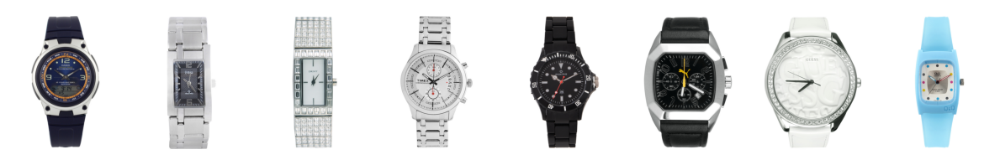

In [31]:
# Listing all the filenames in the watch images folder
watch_image_filenames = os.listdir(watch_images_folder)

# Defining the number of sample images to display
num_samples = 8

# Creating a subplot with one row and 'num_samples' columns, adjusting the figure size
fig, axes = plt.subplots(1, num_samples, figsize=(12, 4))

# Looping through each column in the subplot
for i in range(num_samples):
    # Selecting a random filename from the watch image filenames
    random_filename = random.choice(watch_image_filenames)
    
    # Creating the full path to the random image
    image_path = os.path.join(watch_images_folder, random_filename)
    
    # Opening the image using PIL
    image = Image.open(image_path)
    
    # Displaying the image on the corresponding subplot
    axes[i].imshow(image)
    axes[i].axis('off')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

# Section 8: Colour Analysis on Extracted WristWatch Images

It is important to explore the colour attributes of the wristwatch dataset before delving into creation of price stretegy for the wristwatch products.

This might be helpful in developing a pricing model for each wristwatches base on their colour.This code block explores colour attributes in the extracted wristwatch images.

It starts by counting the number of wristwatches for each base color and then creates count plots to visualize the distribution of wristwatches across different base colors. 

The initial plot displays the count of wristwatches for all base colors, while subsequent plots focuses on the top N base colors. Custom color palettes are defined to represent the top base colors with specific RGB color codes. 

The final visualizations show the number of wristwatches for each of the top base colors, and individual color labels are added on top of each bar to provide more context to the data. 

This analysis helps to understand the distribution of wristwatches based on their base colours in the dataset, providing valuable insights for further exploration and decision-making in this research.

In [32]:
#doublecheccking the number of wristwatch images in the extracted dataset
len(watch_df)

2542

In [33]:
# Counting the occurrences of each base colour in the watch DataFrame
color_counts = watch_df['baseColour'].value_counts()

# Displaying the counts of base colours
color_counts

Black             987
White             579
Silver            272
Steel             151
Blue              120
Grey               66
Pink               58
Brown              55
Gold               55
Red                29
Purple             23
Green              21
Cream              21
Orange             15
Navy Blue          15
Yellow             14
Copper             11
Off White           8
Beige               6
Bronze              6
Olive               6
Lavender            5
Charcoal            5
Maroon              5
Burgundy            2
Metallic            2
Peach               1
Rose                1
Multi               1
Coffee Brown        1
Turquoise Blue      1
Name: baseColour, dtype: int64

In [34]:
# Getting the number of unique base colours in the watch DataFrame
num_unique_colors = len(color_counts)

# Printing the result
print(num_unique_colors)

31


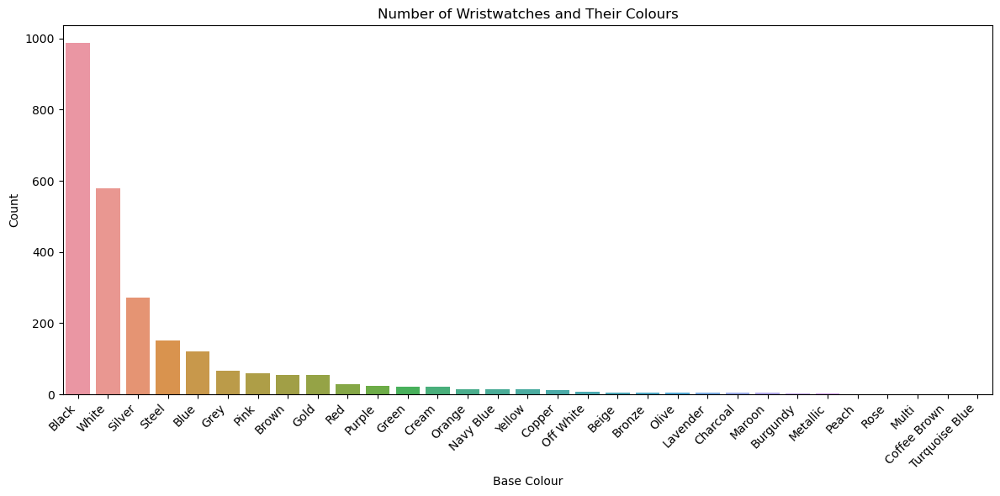

In [35]:
# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their colours
sns.countplot(data=watch_df, x='baseColour', order=color_counts.index)

# Adding a title to the plot
plt.title('Number of Wristwatches and Their Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

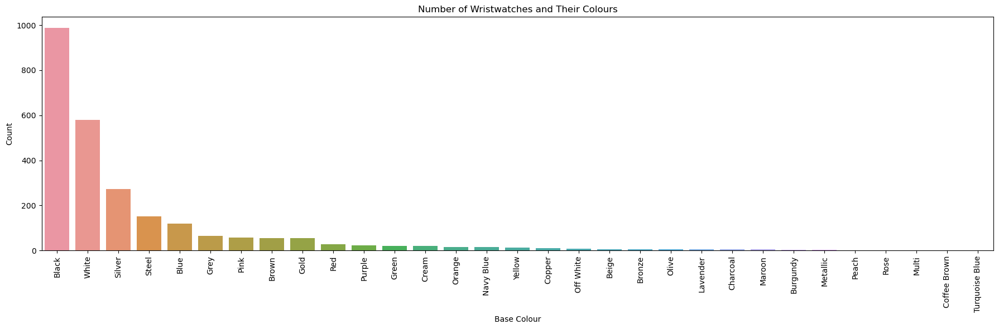

In [36]:
# Setting the size of the figure, increasing the width
plt.figure(figsize=(18, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their colours
sns.countplot(data=watch_df, x='baseColour', order=color_counts.index)

# Adding a title to the plot
plt.title('Number of Wristwatches and Their Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90, ha='center')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

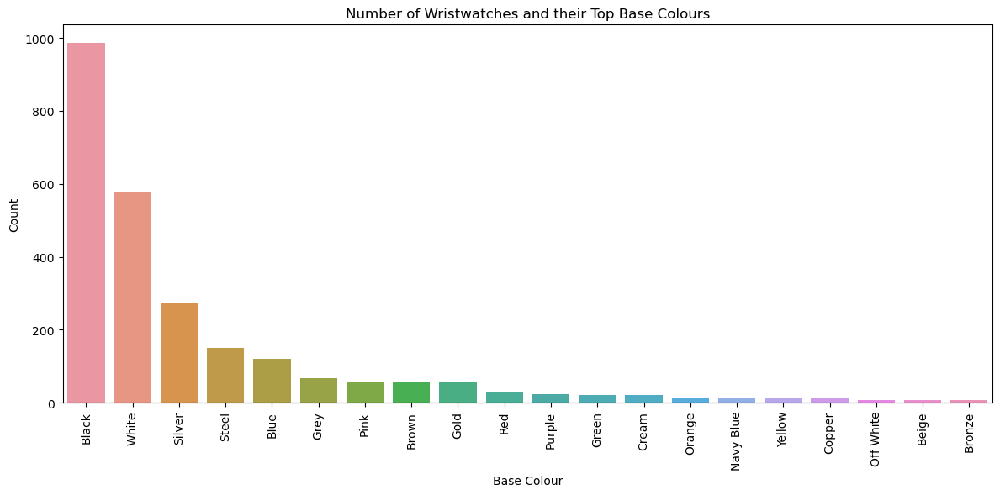

In [37]:
# Setting the number of top base colours to display
N = 20
top_base_colors = color_counts.index[:N]

# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their top base colours
sns.countplot(data=watch_df, x='baseColour', order=top_base_colors)

# Adding a title to the plot
plt.title('Number of Wristwatches and their Top Base Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90, ha='center')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

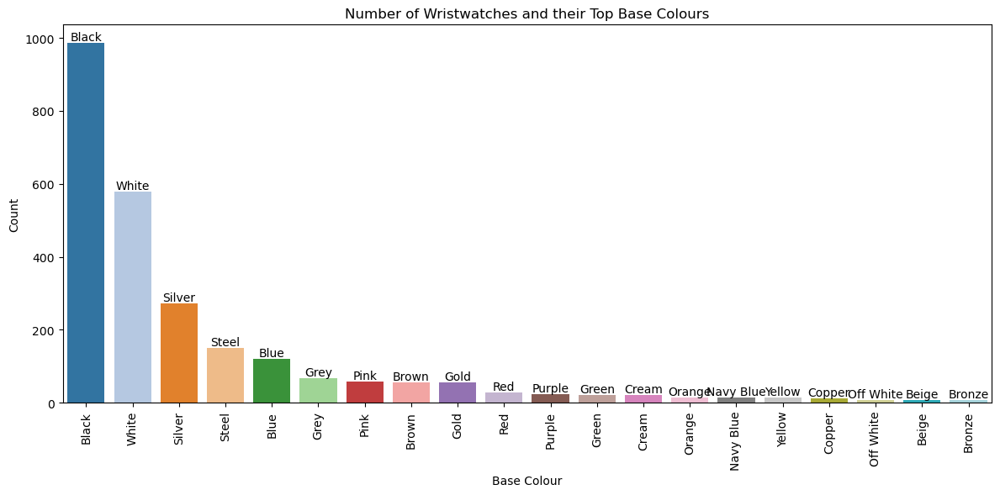

In [38]:
# Setting the number of top base colours to display
N = 20
top_base_colors = color_counts.index[:N]

# Creating a custom colour palette using the "tab20" palette with N colours
custom_palette = sns.color_palette("tab20", N)

# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their top base colours
sns.countplot(data=watch_df, x='baseColour', order=top_base_colors, palette=custom_palette)

# Adding a title to the plot
plt.title('Number of Wristwatches and their Top Base Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90, ha='center')

# Adding text labels above each bar to display the colour name and count
for i, color in enumerate(top_base_colors):
    plt.text(i, watch_df[watch_df['baseColour'] == color]['baseColour'].count(), color, ha='center', va='bottom')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

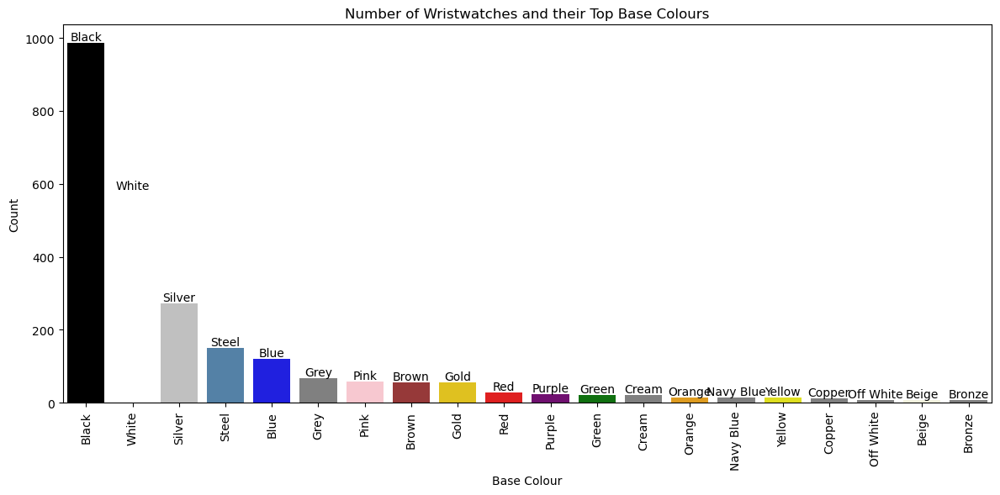

In [39]:
# Setting the number of top base colors to consider
N = 20
top_base_colors = color_counts.index[:N]

# Creating a dictionary to map color names to specific color values
color_dict = {
    'Black': 'black',
    'White': 'white',
    'Blue': 'blue',
    'Grey': 'grey',
    'Brown': 'brown',
    'Silver': 'silver',
    'Red': 'red',
    'Green': 'green',
    'Multi': 'gray',  # Using gray for 'Multi' color
    'Gold': 'gold',
    'Beige': 'beige',
    'Steel': 'steelblue',  
    'Navy': 'navy',
    'Yellow': 'yellow',
    'Purple': 'purple',
    'Charcoal': 'darkgray',  # Changing 'Charcoal' to a specific color like 'darkgray'
    'Maroon': 'maroon',
    'Orange': 'orange',
    'Pink': 'pink',
}

# Creating a custom color palette based on the color dictionary
custom_palette = [color_dict.get(color, 'gray') for color in top_base_colors]

# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their top base colors
sns.countplot(data=watch_df, x='baseColour', order=top_base_colors, palette=custom_palette)

# Adding a title to the plot
plt.title('Number of Wristwatches and their Top Base Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90, ha='center')

# Adding text labels above each bar to display the color name and count
for i, color in enumerate(top_base_colors):
    plt.text(i, watch_df[watch_df['baseColour'] == color]['baseColour'].count(), color, ha='center', va='bottom')

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

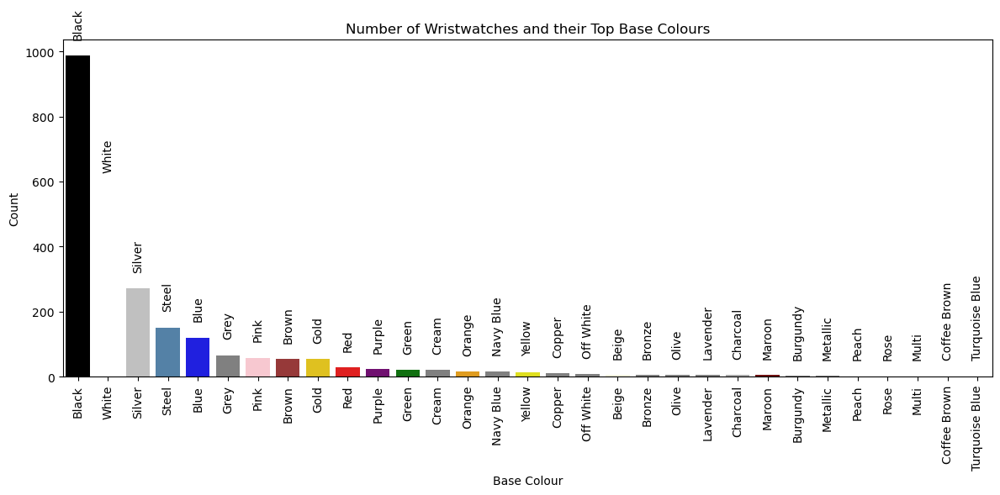

In [40]:
# Setting the number of top base colors to consider
N = 31
top_base_colors = color_counts.index[:N]

# Creating a dictionary to map color names to specific color values
color_dict = {
    'Black': 'black',
    'White': 'white',
    'Blue': 'blue',
    'Grey': 'grey',
    'Brown': 'brown',
    'Silver': 'silver',
    'Red': 'red',
    'Green': 'green',
    'Multi': 'gray',  
    'Gold': 'gold',
    'Beige': 'beige',
    'Steel': 'steelblue',  
    'Navy': 'navy',
    'Yellow': 'yellow',
    'Purple': 'purple',
    'Charcoal': 'darkgray',  
    'Maroon': 'maroon',
    'Orange': 'orange',
    'Pink': 'pink',
}

# Creating a custom color palette based on the color dictionary
custom_palette = [color_dict.get(color, 'gray') for color in top_base_colors]

# Setting the size of the figure
plt.figure(figsize=(12, 6))

# Creating a countplot using seaborn to visualize the number of wristwatches and their top base colors
sns.countplot(data=watch_df, x='baseColour', order=top_base_colors, palette=custom_palette)

# Adding a title to the plot
plt.title('Number of Wristwatches and their Top Base Colours')

# Adding labels to the x-axis and y-axis
plt.xlabel('Base Colour')
plt.ylabel('Count')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90, ha='center')

# Adding text labels on the x-axis to display the color names
for i, color in enumerate(top_base_colors):
    count = watch_df[watch_df['baseColour'] == color]['baseColour'].count()
    plt.text(i, count + 50, color, ha='center', va='bottom', rotation=90)

# Adjusting the layout for better visualization
plt.tight_layout()

# Displaying the plot
plt.show()

# Section 9: Pricing of wristwatch images

This code segment assigns prices to each wristwatch image based on their dominant colors using the ColorThief library. It randomly selects a subset of wristwatch images and calculates the dominant colors and their pixel counts using the ColorThief library. 

It determines prices for each dominant color cluster based on the total intensity of the dominant color. Depending on the intensity range, prices are assigned: a dominant color with intensity greater than 700 gets a random price between £400 and £500, intensity between 600 and 700 receives prices ranging from £350 to £400, and intensity below 600 gets prices between £120 and £350. 

The code then displays a 4x4 grid of wristwatch images alongside their assigned prices, demonstrating the connection between dominant colors and pricing within the specified ranges.

In [41]:
def plot_wristwatch_prices(wristwatch_images_folder, num_samples=8):
    # List all image files in the wristwatch images folder
    wristwatch_image_files = os.listdir(wristwatch_images_folder)

    # Randomly select num_samples wristwatch images from the folder
    selected_image_files = random.sample(wristwatch_image_files, num_samples)

    # Create a 4x4 grid of subplots to display the wristwatch images with prices
    plt.figure(figsize=(12, 12))
    for i, image_file in enumerate(selected_image_files):
        plt.subplot(4, 4, i + 1)

        # Create the full path to the wristwatch image
        image_path = os.path.join(wristwatch_images_folder, image_file)
        
        # Load the wristwatch image using OpenCV
        img = cv2.imread(image_path)

        # Convert the BGR image to RGB format
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Calculate the price based on the dominant color of the image
        price = calculate_price_based_on_dominant_color(img_rgb)

        # Display the wristwatch image with the price as the title
        plt.imshow(img_rgb)
#         plt.title(f'Price: £{price:.2f}')
        plt.axis('off')

        # Display the price on the image
        plt.text(10, 10, f'£{price:.2f}', color='white', fontsize=10, fontweight='bold', 
                 bbox=dict(facecolor='black', alpha=0.8))

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [42]:
def calculate_price_based_on_dominant_color(image):
    # Convert the numpy image array to a PIL Image object
    pil_image = Image.fromarray(image.astype(np.uint8))  # Convert to uint8
    
    # Create an in-memory byte array to hold the image data
    img_byte_array = io.BytesIO()
    
    # Save the PIL Image to the byte array in JPEG format
    pil_image.save(img_byte_array, format='JPEG')
    
    # Move the byte array's cursor to the beginning of the data
    img_byte_array.seek(0)
    
    # Use ColorThief to extract the dominant color from the image byte array
    dominant_color = ColorThief(img_byte_array).get_color(quality=1)
    
    # Calculate the total intensity of the dominant color (sum of RGB values)
    total_intensity = sum(dominant_color)
    
    # Determine the price based on the total intensity of the dominant color
    if total_intensity > 700:
        price = random.uniform(400, 500)  # High price range for intense colors
    elif total_intensity > 600:
        price = random.uniform(350, 400)  # Medium price range for moderately intense colors
    else:
        price = random.uniform(120, 350)  # Low price range for less intense colors
    
    return price  # Return the calculated price

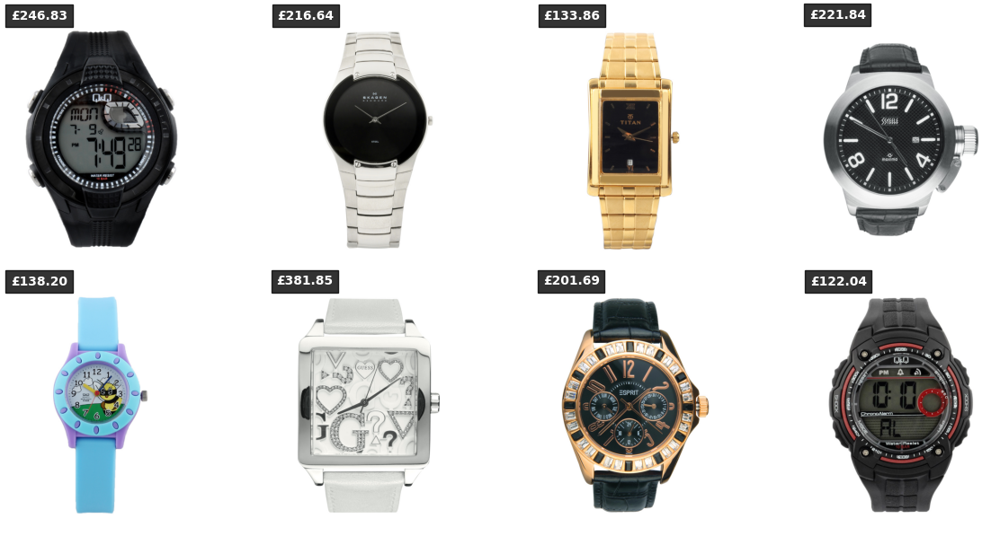

In [43]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices(watch_images_folder, num_samples=8)

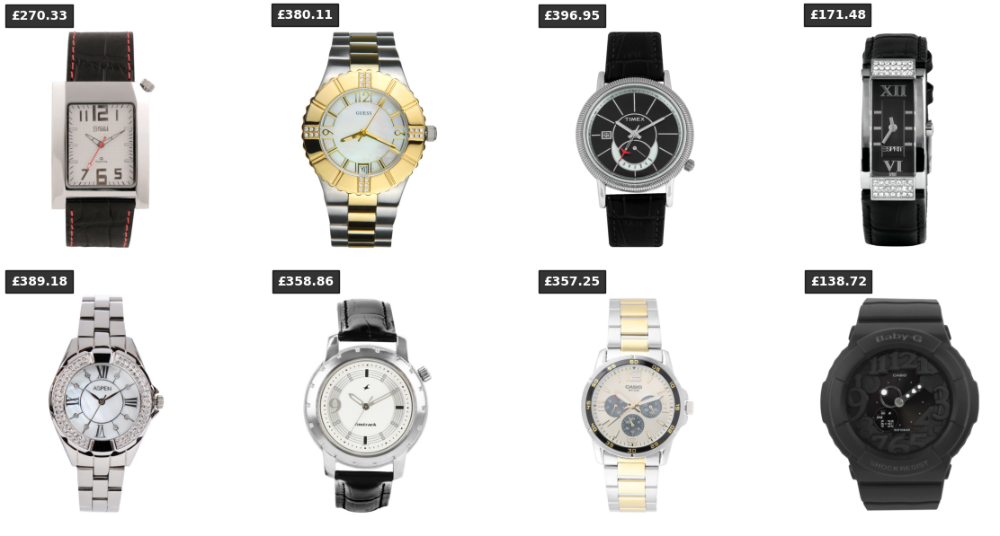

In [44]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices(watch_images_folder, num_samples=8)

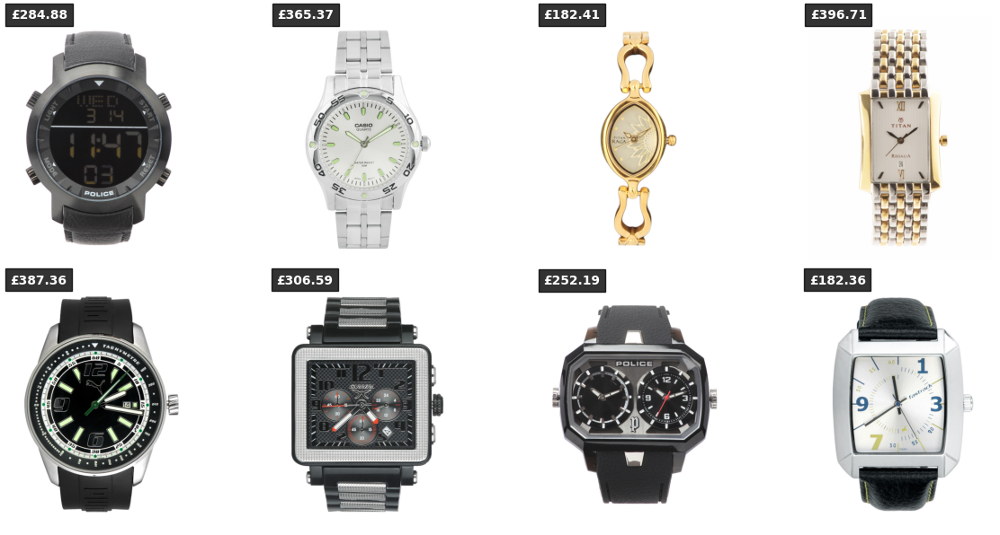

In [45]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices(watch_images_folder, num_samples=8)

### Another Pricing Method

This code block attempts to develop a pricing method base on the wristwatch base colours extracted from the dataset.

The prices are assigned to the dominant color clusters based on their order of dominance, where the most dominant color, such as black, is assigned a price randomly ranging between £400 and £500. 

The next five dominant colors, such as white, silver, steel, blue, and grey, are assigned prices randomly ranging between £350 and £400. Any remaining dominant colors receive prices randomly ranging between £120 and £350. 

The code then visualizes the results, providing an illustrative representation of the relationship between dominant colors and pricing within the specified price ranges.

In [46]:
def get_base_color(image_filename):
    # Dictionary mapping color names to their associated keywords
    color_mapping = {
        'Black': ['black'],
        'White': ['white'],
        'Silver': ['silver'],
        'Steel': ['steel'],
        'Blue': ['blue'],
        'Grey': ['grey'],
        'Pink': ['pink'],
        'Brown': ['brown'],
        'Gold': ['gold'],
        'Red': ['red'],
        'Purple': ['purple'],
        'Green': ['green'],
        'Cream': ['cream'],
        'Orange': ['orange'],
        'Navy Blue': ['navy', 'blue'],
        'Yellow': ['yellow'],
        'Copper': ['copper'],
        'Off White': ['off', 'white'],
        'Beige': ['beige'],
        'Bronze': ['bronze'],
        'Olive': ['olive'],
        'Lavender': ['lavender'],
        'Charcoal': ['charcoal'],
        'Maroon': ['maroon'],
        'Burgundy': ['burgundy'],
        'Metallic': ['metallic'],
        'Peach': ['peach'],
        'Rose': ['rose'],
        'Multi': ['multi'],
        'Coffee Brown': ['coffee', 'brown'],
        'Turquoise Blue': ['turquoise', 'blue'],
    }

    # Convert the image filename to lowercase for matching
    lowercase_filename = image_filename.lower()

    # Initialize the base_color variable as None
    base_color = None

    # Loop through each color and its associated keywords
    for color, keywords in color_mapping.items():
        for keyword in keywords:
            # Check if any keyword is present in the lowercase filename
            if keyword in lowercase_filename:
                # If a keyword is found, assign the color as the base color
                base_color = color
                break
        # If base_color is assigned, exit the loop
        if base_color:
            break

    # If no base color is found, default to 'Other'
    if not base_color:
        base_color = 'Other'

    # Return the determined base color
    return base_color

In [47]:
def plot_wristwatch_prices_fine_tune(wristwatch_images_folder, num_samples=8):
    # Dictionary mapping base colors to their associated price ranges
    price_ranges = {
        'Black': (400, 500),
        'White': (350, 400),
        'Silver': (350, 400),
        'Steel': (350, 400),
        'Blue': (350, 400),
        'Grey': (350, 400),
    }

    # List all image files in the wristwatch images folder
    wristwatch_image_files = os.listdir(wristwatch_images_folder)

    # Randomly select num_samples wristwatch images from the folder
    selected_image_files = random.sample(wristwatch_image_files, num_samples)

    # Create a 4x4 grid of subplots to display the wristwatch images with prices
    plt.figure(figsize=(12, 12))
    for i, image_file in enumerate(selected_image_files):
        plt.subplot(4, 4, i + 1)

        # Get the full path of the image
        image_path = os.path.join(wristwatch_images_folder, image_file)

        # Open the image using the PIL library
        img = Image.open(image_path)

        # Get the base color of the image from the filename
        base_color = get_base_color(image_file)  # Implement this function

        # Get the price range for the base color from the price_ranges dictionary
        price_range = price_ranges.get(base_color, (120, 350))

        # Calculate a random price within the specified range
        price = random.uniform(price_range[0], price_range[1])

        # Display the wristwatch image
        plt.imshow(img)
        plt.axis('off')
#         plt.title(f'Price: £{price:.2f}')

        # Display the price on the image
        plt.text(10, 10, f'£{price:.2f}', color='white', fontsize=10, fontweight='bold', 
                 bbox=dict(facecolor='black', alpha=0.8))

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

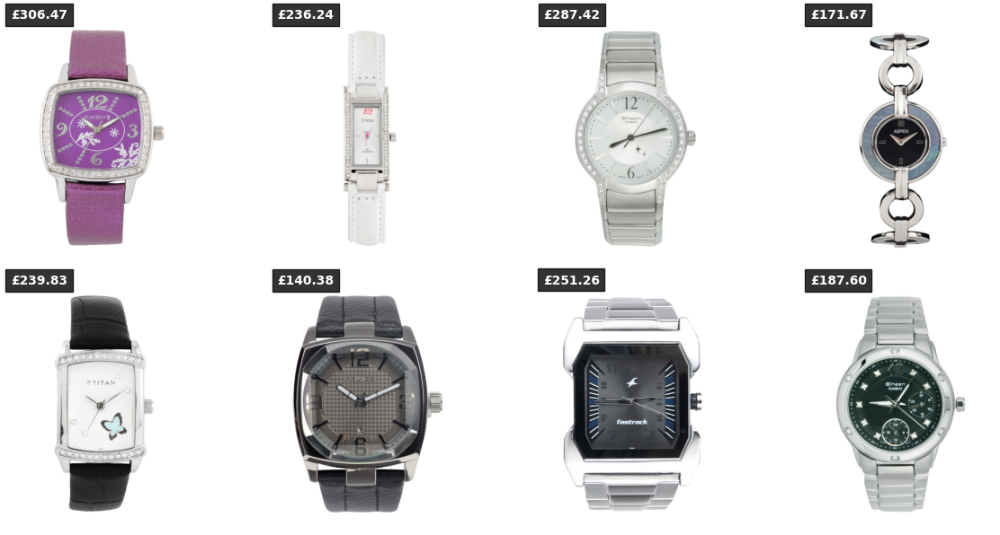

In [48]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices_fine_tune(watch_images_folder, num_samples=8)

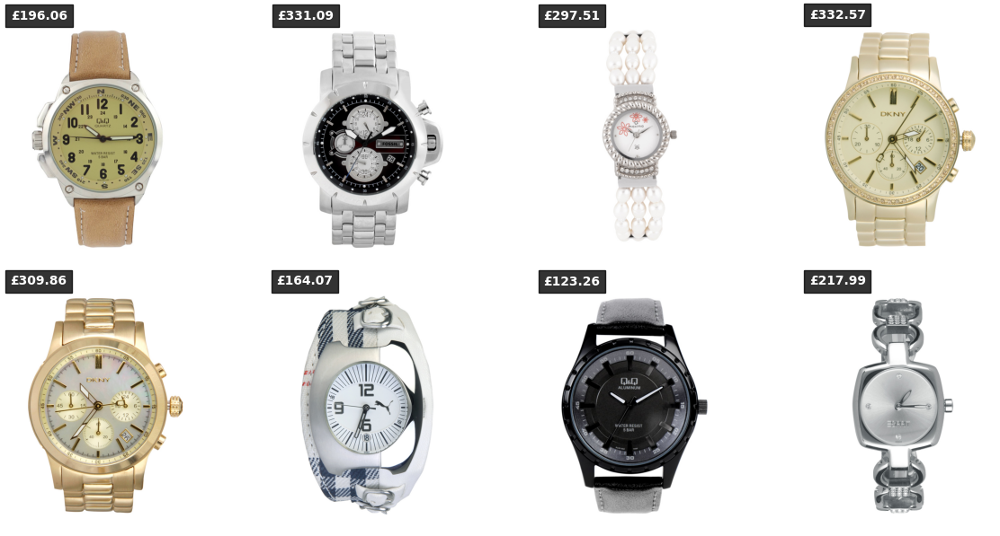

In [50]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices_fine_tune(watch_images_folder, num_samples=8)

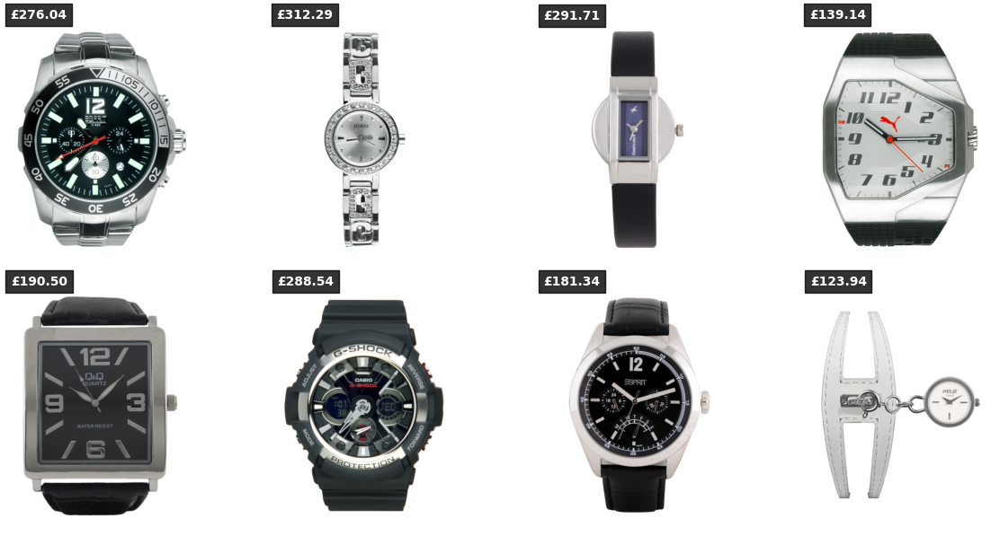

In [51]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices_fine_tune(watch_images_folder, num_samples=8)

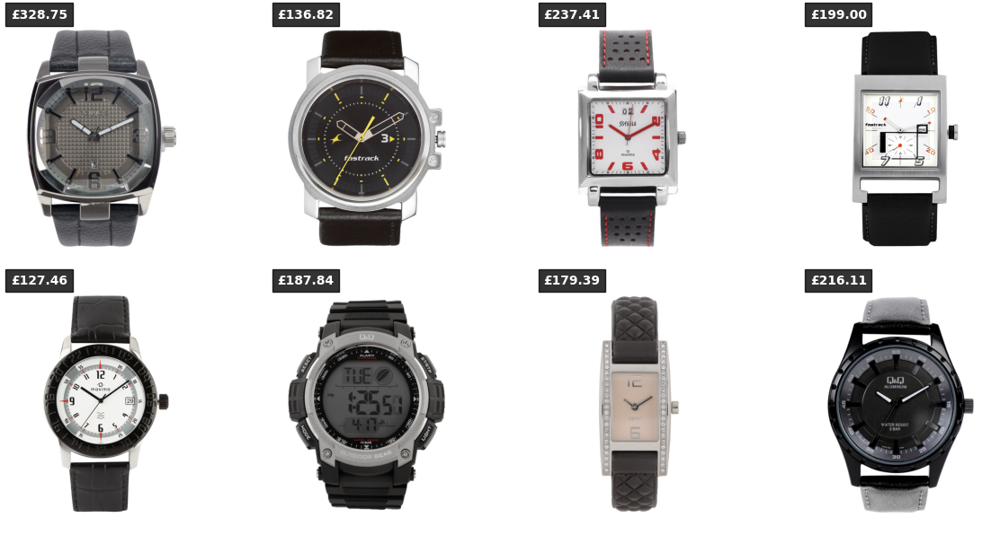

In [52]:
# Call the function to generate and plot wristwatch images with prices in monetary form
plot_wristwatch_prices_fine_tune(watch_images_folder, num_samples=8)

# Section 10: Wristwatches Image Data Processing and Visualization

This section defines functions to load and preprocess the extracted wristwatch images and plots a grid of the preprocessed images. 

It creates a function that loads images, converts their colour format, resizes them, and normalizes pixel values. The square grid of preprocessed wristwatch images were displayed using Matplotlib. 

Finally, the code loads wristwatch images, preprocesses them, and plots the first 36 images in a 6x6 grid.

In [206]:
# Function to load and preprocess the images
def load_and_preprocess_images(path, size=256):
    """
    Loads and preprocesses all images from the given path.

    Parameters:
        path (str): The path to the directory containing the wristwatch images.
        size (int): The size to resize the images.

    Returns:
        np.array: An array of preprocessed images.
    """
    # Create an empty list to store images.
    image_list = []

    # List all files in the specified 'path'.
    files = os.listdir(path)

    # Iterate through each filename.
    for filename in files:
        # Construct the full path to the image file.
        image_path = os.path.join(path, filename)

        # Read the image from the file using OpenCV.
        img = cv2.imread(image_path)

        # Check if the image is loaded successfully. If not, print an error message and skip to the next image.
        if img is None:
            print(f"Image '{filename}' not found.")
            continue

        # Convert the color format of the image from BGR to RGB.
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Resize the image to the specified 'size'.
        img = cv2.resize(img, (size, size))

        # Normalize the pixel values of the image to the range [-1, 1].
        img = (img - 127.5) / 127.5

        # Add the preprocessed image to the image list.
        image_list.append(img)

    # Convert the image list to a NumPy array and return it.
    return np.array(image_list)

In [207]:
# Load and preprocess the watch images
image_data = load_and_preprocess_images('/home/718764/Downloads/fashion-dataset/wristwatch_images/', size=256)

/tmp/ipykernel_28774/2782878646.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(sqr, sqr, i+1)


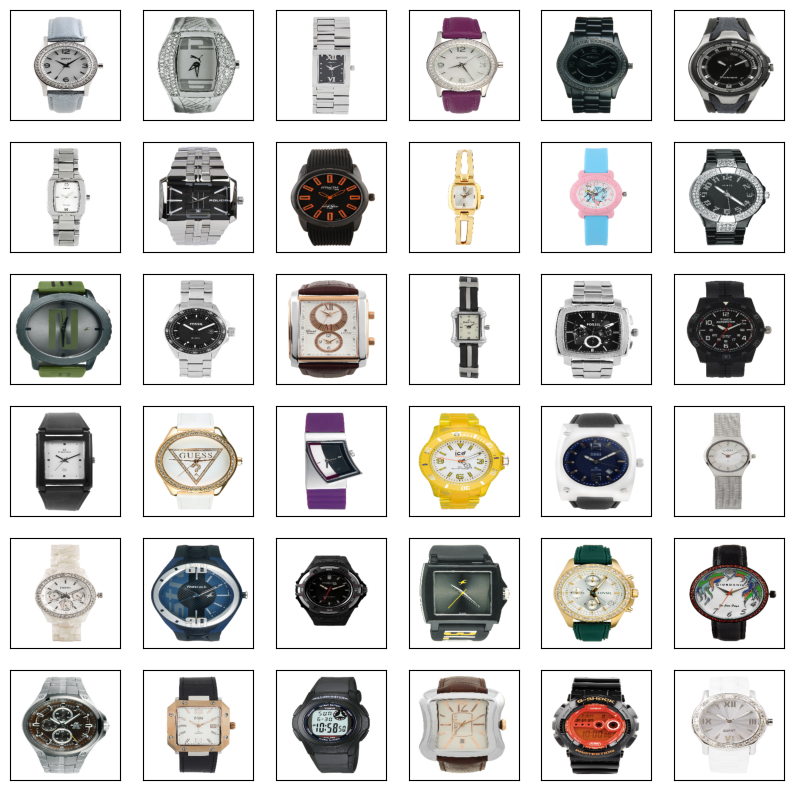

In [208]:
# Function to plot a grid of images from the image_data array
# Parameters:
#   image_data (np.array): A NumPy array containing preprocessed image data.
#   sqr (int): The square root of the number of images to be displayed in each row and column of the grid.
def plot_images(image_data, sqr=5, size=256):
    # Create a new figure for displaying the images with a specified size.
    plt.figure(figsize=(10, 10))
    
    # Set the title for the plot.
    plt.title("Real Images", fontsize=35)
    
    # Loop through the number of images to be displayed in the grid.
    for i in range(sqr * sqr):
        # Create a subplot in the grid with the given row, column, and index.
        plt.subplot(sqr, sqr, i+1)
        
        # Display the image in the subplot.
        plt.imshow(image_data[i] * 0.5 + 0.5)  # Scale the image data from [-1, 1] to [0, 1].
        
        # Remove the ticks from the x and y axes to make the grid clean.
        plt.xticks([])
        plt.yticks([])

# Check if the image_data is not empty
if len(image_data) > 0:
    # Call the plot_images function with the image_data and sqr=6.
    plot_images(image_data, sqr=6)
else:
    # Print a message if no images are found or if an error occurred during image processing.
    print("No images found or an error occurred during image processing.")

# Section 11: Generative Adversarial Network for wristwatch design

This series of code blocks serves to create a dataset for training a GAN, define the architecture of both the Generator and Discriminator models using TensorFlow's Keras API, and visually demonstrate the process of the wristwatches image generation. 

The images are preprocessed, normalized, and stored in an array, which is then used to create a dataset. The Generator model generates images from random noise, while the Discriminator model evaluates their authenticity. 

These models are constructed with convolutional and dense layers, employing activation functions and normalization techniques. Visualizations showcase generated wristwatch images, offering insight into the GAN's ability to produce realistic wristwatch contents. Overall, these code blocks encapsulate the foundational steps required to build and train a GAN for generating wristwatch images.

The GAN is trained using the RMSprop optimizer and binary cross-entropy loss function. 

The training process involves updating the model parameters for both the Generator and Discriminator using gradients computed with the help of the train_step function. 

In [209]:
# Define the batch size for training.
batch_size = 32

# Create a TensorFlow dataset from the image data.
# The 'tf.data.Dataset.from_tensor_slices()' function is used to create a dataset
# from the 'image_data' array. This function creates a dataset with one element
# for each element in the 'image_data' array.
# Each element of the dataset is a single image in the 'image_data' array.
# The 'batch()' function is then used to batch the elements in the dataset
# into batches of size 'batch_size'.
# The resulting 'dataset' will be used for training a GAN model,
# where each batch will be fed to the model during training.
dataset = tf.data.Dataset.from_tensor_slices(image_data).batch(batch_size)

In [210]:
latent_dim = 100

# Define the generator model.
def Generator():
    model = tf.keras.models.Sequential()

    # Generator input shape
    model.add(tf.keras.layers.Input((latent_dim,)))

    # Add a dense layer with 256 * 32 * 32 units (262144 units) and no bias.
    model.add(tf.keras.layers.Dense(256 * 32 * 32, use_bias=False))

    # Add batch normalization to normalize the activations of the previous layer.
    model.add(tf.keras.layers.BatchNormalization())

    # Add a LeakyReLU activation function to introduce non-linearity.
    model.add(tf.keras.layers.LeakyReLU())

    # Reshape the output to (32, 32, 256) to prepare for convolutional layers.
    model.add(tf.keras.layers.Reshape((32, 32, 256)))

    # Add a transposed convolutional layer with 128 filters, kernel size 4x4,
    # strides of 2, and padding 'same' to upsample the image.
    model.add(tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same', use_bias=False))

    # Add batch normalization to normalize the activations of the previous layer.
    model.add(tf.keras.layers.BatchNormalization())

    # Add a LeakyReLU activation function to introduce non-linearity.
    model.add(tf.keras.layers.LeakyReLU())

    # Add another transposed convolutional layer with 64 filters, kernel size 4x4,
    # strides of 2, and padding 'same' to further upsample the image.
    model.add(tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same', use_bias=False))

    # Add batch normalization to normalize the activations of the previous layer.
    model.add(tf.keras.layers.BatchNormalization())

    # Add a LeakyReLU activation function to introduce non-linearity.
    model.add(tf.keras.layers.LeakyReLU())

    # Add the final transposed convolutional layer with 3 filters (RGB channels),
    # kernel size 4x4, strides of 2, padding 'same', and a tanh activation function.
    # The output shape will be (256, 256, 3) representing the generated image.
    model.add(tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', use_bias=False, activation='tanh'))

    return model

In [211]:
# Create an instance of the Generator model by calling the Generator function defined earlier
generator = Generator()

# Print the summary of the Generator model, which displays the architecture and the number of parameters
generator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 262144)            26214400  
                                                                 
 batch_normalization_2653 (B  (None, 262144)           1048576   
 atchNormalization)                                              
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 262144)            0         
                                                                 
 reshape_3 (Reshape)         (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 64, 64, 128)      524288    
 ranspose)                                                       
                                                                 
 batch_normalization_2654 (B  (None, 64, 64, 128)     

In [212]:
# Define the Discriminator model.
def Discriminator():
    model = tf.keras.models.Sequential()

    # Discriminator input shape
    model.add(tf.keras.layers.Input((256, 256, 3)))

    # Add the first convolutional layer with 128 filters, kernel size 4x4, stride 2, and 'same' padding
    model.add(tf.keras.layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # Add another convolutional layer with 128 filters, kernel size 4x4, stride 2, and 'same' padding
    model.add(tf.keras.layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # Add another convolutional layer with 256 filters, kernel size 4x4, stride 2, and 'same' padding
    model.add(tf.keras.layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # Add another convolutional layer with 256 filters, kernel size 4x4, stride 2, and 'same' padding
    model.add(tf.keras.layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # Add another convolutional layer with 512 filters, kernel size 4x4, stride 2, and 'same' padding
    model.add(tf.keras.layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))
    model.add(tf.keras.layers.LeakyReLU())
    
    # Flatten the 2D output from the convolutional layers to a 1D vector
    model.add(tf.keras.layers.Flatten())
    
    # Add a dense layer with a single unit and sigmoid activation for binary classification (real or fake)
    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
    
    return model

In [213]:
# Create an instance of the Discriminator model
discriminator = Discriminator()

# Display a summary of the model architecture
discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2647 (Conv2D)        (None, 128, 128, 128)     6144      
                                                                 
 batch_normalization_2656 (B  (None, 128, 128, 128)    512       
 atchNormalization)                                              
                                                                 
 leaky_re_lu_27 (LeakyReLU)  (None, 128, 128, 128)     0         
                                                                 
 conv2d_2648 (Conv2D)        (None, 64, 64, 128)       262144    
                                                                 
 batch_normalization_2657 (B  (None, 64, 64, 128)      512       
 atchNormalization)                                              
                                                                 
 leaky_re_lu_28 (LeakyReLU)  (None, 64, 64, 128)      

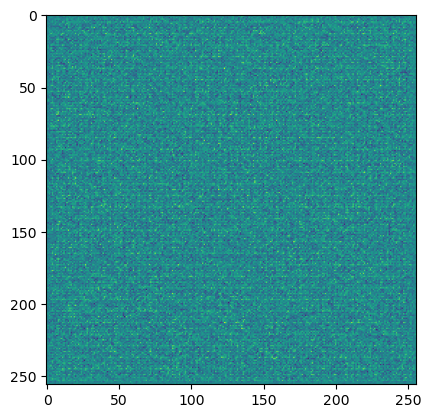

In [214]:
# Generate random noise as input for the Generator
noise = np.random.normal(-1, 1, (1, latent_dim))

# Use the Generator model to generate a wristwatch image from the random noise
img = generator(noise)

# Display the generated image
plt.imshow(img[0, :, :, 0])
plt.show()

This code block defines the GAN wristwatch design training process. 

It sets up the optimizer, loss functions, and training steps for both the generator and discriminator. The optimizer's learning rate and clip value are specified, and binary cross-entropy loss functions are defined to measure the discrepancies between real and generated images. 

The generator and discriminator losses are computed using these functions, and separate optimizers are created for each model. 

The train_step function implements a single training step using gradient calculations and updates the model parameters accordingly. 

The train function integrates the training loop, iterating through epochs and batches, while recording and displaying the generator and discriminator losses over time.

In [215]:
# Define the optimizer for training the models
optimizer = tf.keras.optimizers.RMSprop(
    learning_rate=0.0001,
    clipvalue=1.0
)

# Define the binary cross-entropy loss function for the GAN
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

# Define the loss function for the Generator
def generator_loss(fake_output):
    # Calculate the binary cross-entropy loss for the Generator
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Define the loss function for the Discriminator
def discriminator_loss(fake_output, real_output):
    # Calculate the binary cross-entropy loss for the Discriminator
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    return fake_loss + real_loss

# Define separate optimizers for the Generator and Discriminator models
generator_optimizer = optimizers.RMSprop(learning_rate=0.0001, clipvalue=1.0)
discriminator_optimizer = optimizers.RMSprop(learning_rate=0.0001, clipvalue=1.0)

In [216]:
@tf.function
def train_step(images):
    # Generate random noise as input to the generator
    noise = tf.random.normal([batch_size, latent_dim])

    # Use GradientTape to calculate gradients and train both the Generator and Discriminator
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate images using the Generator
        generated_images = generator(noise, training=True)

        # Get Discriminator outputs for real and fake images
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # Calculate losses for both Generator and Discriminator
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(fake_output, real_output)

    # Calculate gradients for Generator and Discriminator
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradients to update Generator and Discriminator parameters
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def train(epochs, dataset):
    gen_losses = []
    disc_losses = []
    for epoch in range(epochs):
        start_time = time.time()
        for image_batch in dataset:
            # Train for a single batch and record losses
            gen_loss, disc_loss = train_step(image_batch)
            gen_losses.append(gen_loss)
            disc_losses.append(disc_loss)

        # Print the losses and elapsed time for the epoch
        print(f"Epoch {epoch + 1}, Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}, Time: {time.time() - start_time:.2f}s")

    return gen_losses, disc_losses

In [217]:
# Function to generate and plot images using the generator model with prices in pounds
def generate_and_plot_images_with_prices(model, num_samples=16):
    # Generate random noise as input to the generator
    noise = tf.random.normal([num_samples, latent_dim])
    
    # Use the generator model to generate images from the random noise
    generated_images = model(noise)
    
    # Create a 4x4 grid of subplots to display the generated images with prices
    plt.figure(figsize=(10, 10))
    for i in range(num_samples):
        plt.subplot(4, 4, i + 1)
        img = (generated_images[i] + 1) / 2.0
        plt.imshow(img)
        plt.axis('off')

        # Convert the generated image to a PIL image
        img_array = (tf.image.convert_image_dtype(img, dtype=tf.uint8) * 255).numpy()
        pil_image = Image.fromarray(img_array)

        # Use an in-memory file object to pass the image to ColorThief
        img_byte_array = io.BytesIO()
        pil_image.save(img_byte_array, format='JPEG')
        img_byte_array.seek(0)

        # Get the dominant color of the image
        dominant_color = ColorThief(img_byte_array).get_color(quality=1)
        
        # Calculate a random higher price based on the dominant color
        price = calculate_price_based_on_dominant_color(dominant_color)
        price_pounds = f"£{price:.2f}"
        
        # Display the price as text on top of the image
        plt.text(0.5, 0.95, price_pounds, color='black', fontsize=10, fontweight='bold',
                 transform=plt.gca().transAxes, ha='center')
    
    # Show the plotted images with prices
    plt.tight_layout()
    plt.show()

    
def calculate_price_based_on_dominant_color(dominant_color):
    # Calculate the total intensity of the dominant color
    total_intensity = sum(dominant_color)
    
    # Assign prices based on the intensity of the dominant color
    if total_intensity > 700:
        price = random.uniform(400, 500)  # Random price between 400 and 500 pounds for the highest dominant color
    elif total_intensity > 600:
        price = random.uniform(350, 400)  # Random price between 350 and 400 pounds for the next 5 dominant colors
    else:
        price = random.uniform(120, 350)  # Random price between 120 and 350 pounds for the remaining dominant colors
    
    return price

# Section 12: Evaluation Metrics for GAN-Generated Wristwatch Images: Frechet Inception Distance (FID), Inception score(IS) and Structural Similarity Index (SSIM)

This code segment evaluates the quality of generated images using three different metrics: Frechet Inception Distance (FID), Inception Score (IS), and Structural Similarity Index (SSIM).

The calculate_fid function computes the FID score, leverages the activations of the InceptionV3 model to extract features and calculate the FID based on feature means and covariances.

The calculate_inception_score function calculates the Inception Score, utilizes the activations of the InceptionV3 model to estimate the IS by comparing the predicted class probabilities of the generated images.

The code further computes the SSIM score which quantifies how closely the structure, luminance, contrast, and pixel values of the generated images resemble those of the real images.

Finally, the generated images' FID IS and SSIM values are calculated and printed for evaluation after training the GAN model.

In [218]:
# Define a function to plot losses during training
def plot_losses(gen_losses, disc_losses):
    # Create a new figure with a specific size for the plot
    plt.figure(figsize=(10, 6))

    # Plot the generator and discriminator losses over training steps
    plt.plot(range(len(gen_losses)), gen_losses, label='Generator Loss')  # Plot generator loss
    plt.plot(range(len(disc_losses)), disc_losses, label='Discriminator Loss')  # Plot discriminator loss

    # Set the x and y labels for the plot
    plt.xlabel('Training Steps')  # X-axis label
    plt.ylabel('Loss')  # Y-axis label

    # Set the title of the plot
    plt.title('Generator and Discriminator Losses during Training')  # Plot title

    # Display a legend to identify the lines in the plot
    plt.legend()

    # Show the plot
    plt.show()

In [219]:
# Train model for 400 epochs
num_epochs = 400

# Train the GAN model for the specified number of epochs and save the generated images
gen_losses, disc_losses = train(num_epochs, dataset)

Epoch 1, Generator Loss: 5.1493, Discriminator Loss: 0.5877, Time: 11.87s
Epoch 2, Generator Loss: 14.1236, Discriminator Loss: 0.0006, Time: 6.94s
Epoch 3, Generator Loss: 18.7330, Discriminator Loss: 8.5608, Time: 7.00s
Epoch 4, Generator Loss: 4.3614, Discriminator Loss: 2.6503, Time: 7.16s
Epoch 5, Generator Loss: 0.0209, Discriminator Loss: 5.0396, Time: 7.32s
Epoch 6, Generator Loss: 2.3420, Discriminator Loss: 1.6122, Time: 7.59s
Epoch 7, Generator Loss: 2.2491, Discriminator Loss: 1.3138, Time: 7.92s
Epoch 8, Generator Loss: 3.0523, Discriminator Loss: 1.0793, Time: 8.60s
Epoch 9, Generator Loss: 2.8541, Discriminator Loss: 0.6513, Time: 9.65s
Epoch 10, Generator Loss: 2.6505, Discriminator Loss: 0.6842, Time: 10.75s
Epoch 11, Generator Loss: 3.4615, Discriminator Loss: 1.3597, Time: 10.80s
Epoch 12, Generator Loss: 3.2044, Discriminator Loss: 0.8771, Time: 12.34s
Epoch 13, Generator Loss: 0.5197, Discriminator Loss: 1.2449, Time: 12.39s
Epoch 14, Generator Loss: 2.4298, Discri

Epoch 111, Generator Loss: 5.2821, Discriminator Loss: 0.0181, Time: 15.20s
Epoch 112, Generator Loss: 3.8936, Discriminator Loss: 0.0835, Time: 15.28s
Epoch 113, Generator Loss: 5.9035, Discriminator Loss: 0.0548, Time: 15.33s
Epoch 114, Generator Loss: 4.9730, Discriminator Loss: 0.0350, Time: 14.55s
Epoch 115, Generator Loss: 5.0353, Discriminator Loss: 0.0317, Time: 13.47s
Epoch 116, Generator Loss: 4.2828, Discriminator Loss: 0.0591, Time: 13.60s
Epoch 117, Generator Loss: 8.2492, Discriminator Loss: 0.1493, Time: 13.52s
Epoch 118, Generator Loss: 3.4074, Discriminator Loss: 0.1141, Time: 14.18s
Epoch 119, Generator Loss: 4.3291, Discriminator Loss: 0.0425, Time: 14.66s
Epoch 120, Generator Loss: 4.8118, Discriminator Loss: 0.0368, Time: 14.58s
Epoch 121, Generator Loss: 4.1977, Discriminator Loss: 0.0676, Time: 14.60s
Epoch 122, Generator Loss: 4.1463, Discriminator Loss: 0.0546, Time: 14.63s
Epoch 123, Generator Loss: 7.7585, Discriminator Loss: 0.0161, Time: 14.57s
Epoch 124, G

Epoch 219, Generator Loss: 5.8981, Discriminator Loss: 0.0279, Time: 14.12s
Epoch 220, Generator Loss: 6.1959, Discriminator Loss: 0.0085, Time: 14.17s
Epoch 221, Generator Loss: 4.4747, Discriminator Loss: 0.0518, Time: 14.13s
Epoch 222, Generator Loss: 5.4711, Discriminator Loss: 0.0167, Time: 14.10s
Epoch 223, Generator Loss: 2.9368, Discriminator Loss: 0.3921, Time: 14.18s
Epoch 224, Generator Loss: 5.8705, Discriminator Loss: 0.0202, Time: 14.32s
Epoch 225, Generator Loss: 6.8209, Discriminator Loss: 0.0128, Time: 14.94s
Epoch 226, Generator Loss: 6.3121, Discriminator Loss: 0.0115, Time: 15.39s
Epoch 227, Generator Loss: 8.4629, Discriminator Loss: 0.0058, Time: 15.36s
Epoch 228, Generator Loss: 6.7573, Discriminator Loss: 0.0138, Time: 15.33s
Epoch 229, Generator Loss: 3.4285, Discriminator Loss: 0.2767, Time: 15.38s
Epoch 230, Generator Loss: 7.7899, Discriminator Loss: 0.0996, Time: 15.22s
Epoch 231, Generator Loss: 7.8436, Discriminator Loss: 0.0020, Time: 15.24s
Epoch 232, G

Epoch 326, Generator Loss: 10.5940, Discriminator Loss: 0.0026, Time: 14.97s
Epoch 327, Generator Loss: 23.5240, Discriminator Loss: 1.3988, Time: 13.68s
Epoch 328, Generator Loss: 4.8943, Discriminator Loss: 0.1123, Time: 13.77s
Epoch 329, Generator Loss: 13.1555, Discriminator Loss: 0.0001, Time: 13.80s
Epoch 330, Generator Loss: 8.7704, Discriminator Loss: 0.0035, Time: 14.16s
Epoch 331, Generator Loss: 11.1497, Discriminator Loss: 0.0016, Time: 14.21s
Epoch 332, Generator Loss: 15.4331, Discriminator Loss: 0.0004, Time: 14.23s
Epoch 333, Generator Loss: 11.7952, Discriminator Loss: 0.0001, Time: 14.27s
Epoch 334, Generator Loss: 11.4777, Discriminator Loss: 0.0007, Time: 14.26s
Epoch 335, Generator Loss: 10.6955, Discriminator Loss: 0.0003, Time: 14.21s
Epoch 336, Generator Loss: 11.5629, Discriminator Loss: 0.0003, Time: 14.27s
Epoch 337, Generator Loss: 6.9954, Discriminator Loss: 0.0065, Time: 14.19s
Epoch 338, Generator Loss: 9.5451, Discriminator Loss: 0.0041, Time: 14.13s
Epo

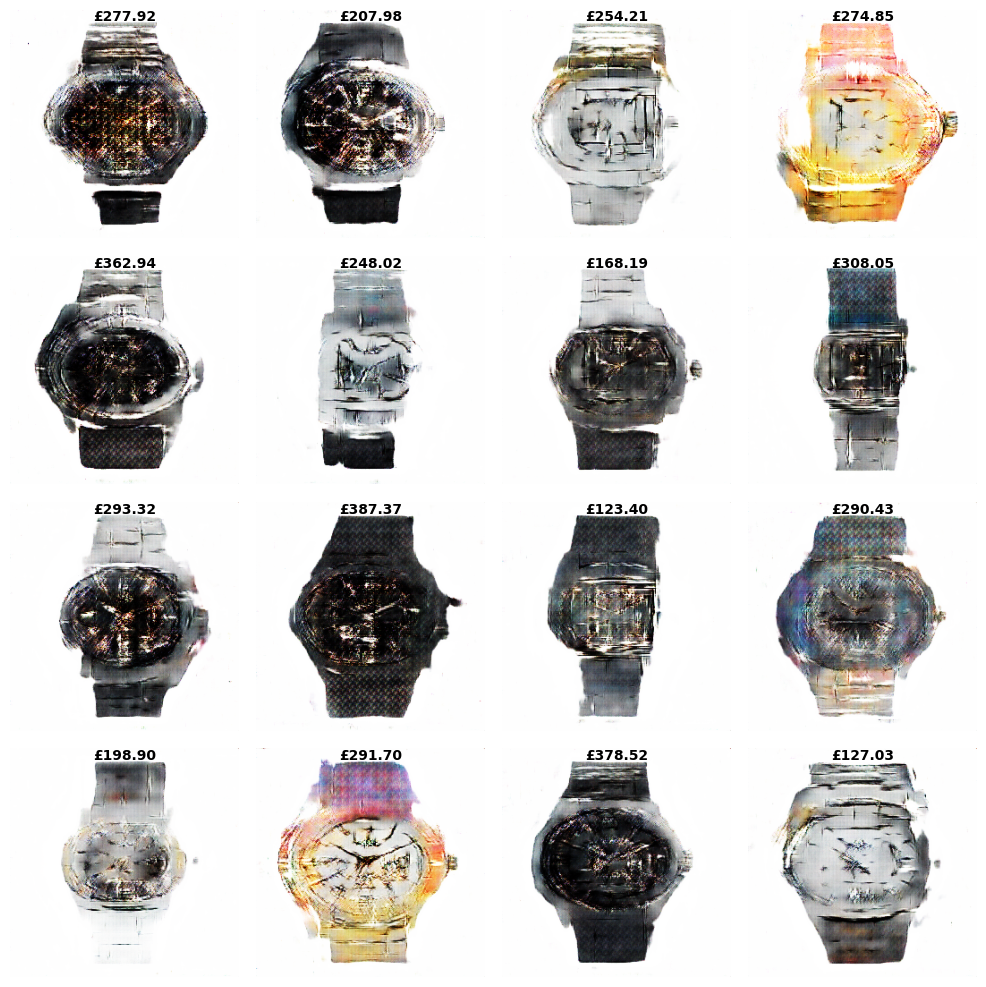

In [220]:
# Generate and display wristwatch images with prices after training
generate_and_plot_images_with_prices(generator, num_samples=16)

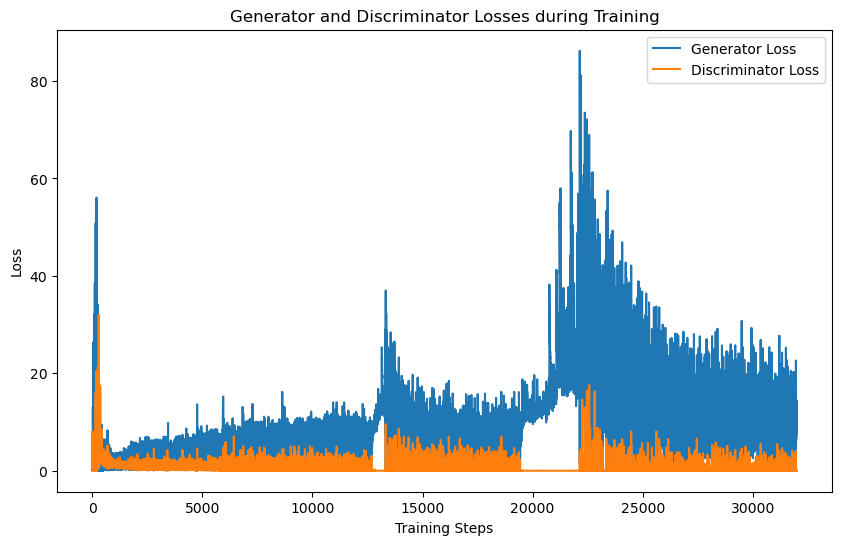

In [235]:
# Plot the generator and discriminator losses during training
plot_losses(gen_losses, disc_losses)

In [225]:
def calculate_fid(real_images, generated_images):
    real_features = extract_features(real_images)
    generated_features = extract_features(generated_images)
    
    mu1, sigma1 = np.mean(real_features, axis=0), np.cov(real_features, rowvar=False)
    mu2, sigma2 = np.mean(generated_features, axis=0), np.cov(generated_features, rowvar=False)
    
    sigma_sqrt = sqrtm(sigma1.dot(sigma2))
    
    trace_term = np.trace(sigma1 + sigma2 - 2 * sigma_sqrt)
    squared_diff = np.dot(mu1 - mu2, mu1 - mu2)
    
    fid_score = squared_diff + trace_term
    
    return fid_score

def extract_features(images):
    inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
    images = preprocess_input(images)
    features = inception_model.predict(images)
    return features

# Resize images to match the input dimensions of InceptionV3 (299x299)
def resize_images(images, target_size=(299, 299)):
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, target_size)
        resized_images.append(resized_img)
    return np.array(resized_images)

# Assuming 'image_data' contains your real images
# Load and preprocess the watch images
image_data = load_and_preprocess_images('/home/718764/Downloads/fashion-dataset/wristwatch_images/', size=256)

# Select the first 100 images for evaluation
real_images = image_data[:100]

# Resize the real images to match the input dimensions of InceptionV3
real_images_resized = resize_images(real_images, target_size=(299, 299))

# Generate 100 images using the trained Generator model for evaluation
generated_images = generator.predict(np.random.normal(-1, 1, (100, latent_dim)))

# Resize the generated images to match the input dimensions of InceptionV3
generated_images_resized = resize_images(generated_images, target_size=(299, 299))

# Calculate FID score using the resized images
fid_score = calculate_fid(real_images_resized, generated_images_resized)

# Take the real part of the FID score
real_fid_score = fid_score.real

# Round the FID score to two decimal places
rounded_fid_score = round(real_fid_score, 2)

# Print the rounded FID score
print(f"Rounded FID Score: {rounded_fid_score}")

4/4 [==============================] - 1s 26ms/step
Rounded FID Score: 39.16


In [226]:
def calculate_inception_score(images, num_splits=10):
    inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
    images = preprocess_input(images)
    preds = inception_model.predict(images)
    
    scores = []
    for i in range(num_splits):
        part = preds[i * (preds.shape[0] // num_splits): (i + 1) * (preds.shape[0] // num_splits), :]
        part = np.clip(part, 1e-10, 1.0)
        kl_div = part * (np.log(part) - np.log(np.expand_dims(np.mean(part, 0), 0)))
        kl_div = np.mean(np.sum(kl_div, 1))
        scores.append(np.exp(kl_div))
    
    return np.mean(scores)

# Calculate the Inception Score
inception_mean = calculate_inception_score(generated_images_resized)
print(f"Inception Score - Mean: {inception_mean:.2f}")

4/4 [==============================] - 1s 26ms/step
Inception Score - Mean: 1.00


In [227]:
# Load and preprocess the watch images
image_data = load_and_preprocess_images('/home/718764/Downloads/fashion-dataset/wristwatch_images/', size=256)

# Select the first 100 images for evaluation
real_images = image_data[:100]

# Generate 100 images using the trained Generator model for evaluation
latent_dim = 100
generated_images = generator.predict(np.random.normal(-1, 1, (100, latent_dim)))

# Rescale generated images to the range [0, 255]
generated_images = (generated_images + 1) * 127.5

# Convert generated images to uint8 and ensure they're in the range [0, 255]
generated_images = np.clip(generated_images, 0, 255).astype(np.uint8)

# Convert real images to uint8 and ensure they're in the range [0, 255]
real_images = np.clip(real_images, 0, 255).astype(np.uint8)

# Calculate SSIM for each pair of real and generated images
ssim_scores = []
for real_img, generated_img in zip(real_images, generated_images):
    # Convert images to grayscale (SSIM works with grayscale images)
    real_img_gray = cv2.cvtColor(real_img, cv2.COLOR_RGB2GRAY)
    generated_img_gray = cv2.cvtColor(generated_img, cv2.COLOR_RGB2GRAY)
    
    # Calculate SSIM score
    ssim = compare_ssim(real_img_gray, generated_img_gray)
    ssim_scores.append(ssim)

# Calculate the mean SSIM score
mean_ssim_score = np.mean(ssim_scores)

# Round the SSIM score to two decimal places
rounded_ssim_score = round(mean_ssim_score, 2)

# Print the rounded SSIM score
print(f"Rounded SSIM Score: {rounded_ssim_score}")

4/4 [==============================] - 0s 6ms/step
Rounded SSIM Score: 0.01


## More Visualization of the Generated Images

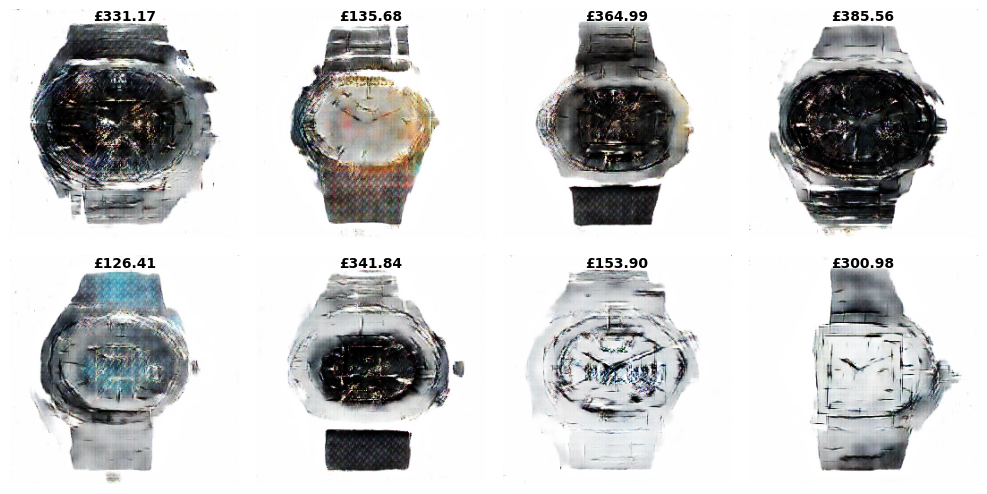

In [228]:
# Generate and display wristwatch images with prices after training
generate_and_plot_images_with_prices(generator, num_samples=8)

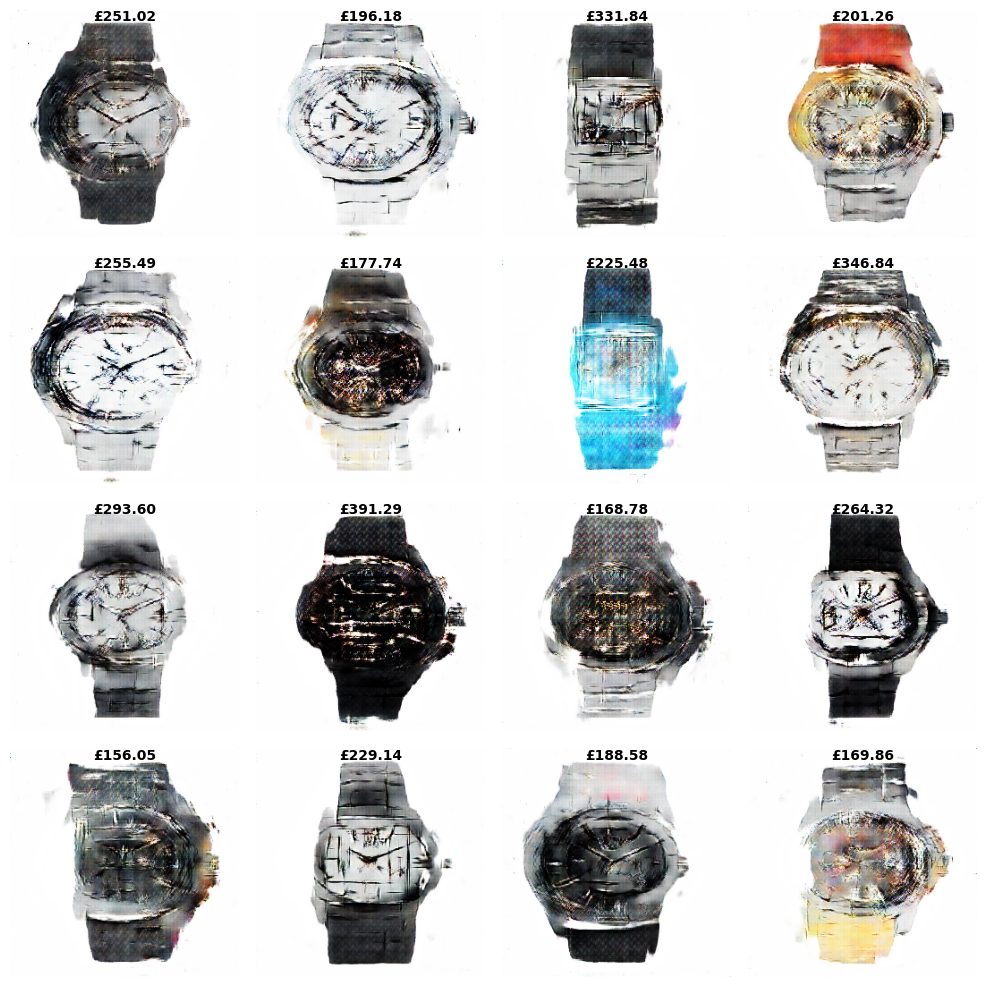

In [229]:
# Generate and display wristwatch images with prices after training
generate_and_plot_images_with_prices(generator, num_samples=16)

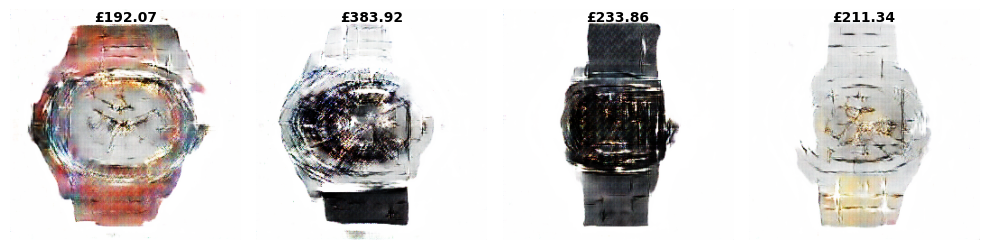

In [232]:
# Generate and display wristwatch images with prices after training
generate_and_plot_images_with_prices(generator, num_samples=4)

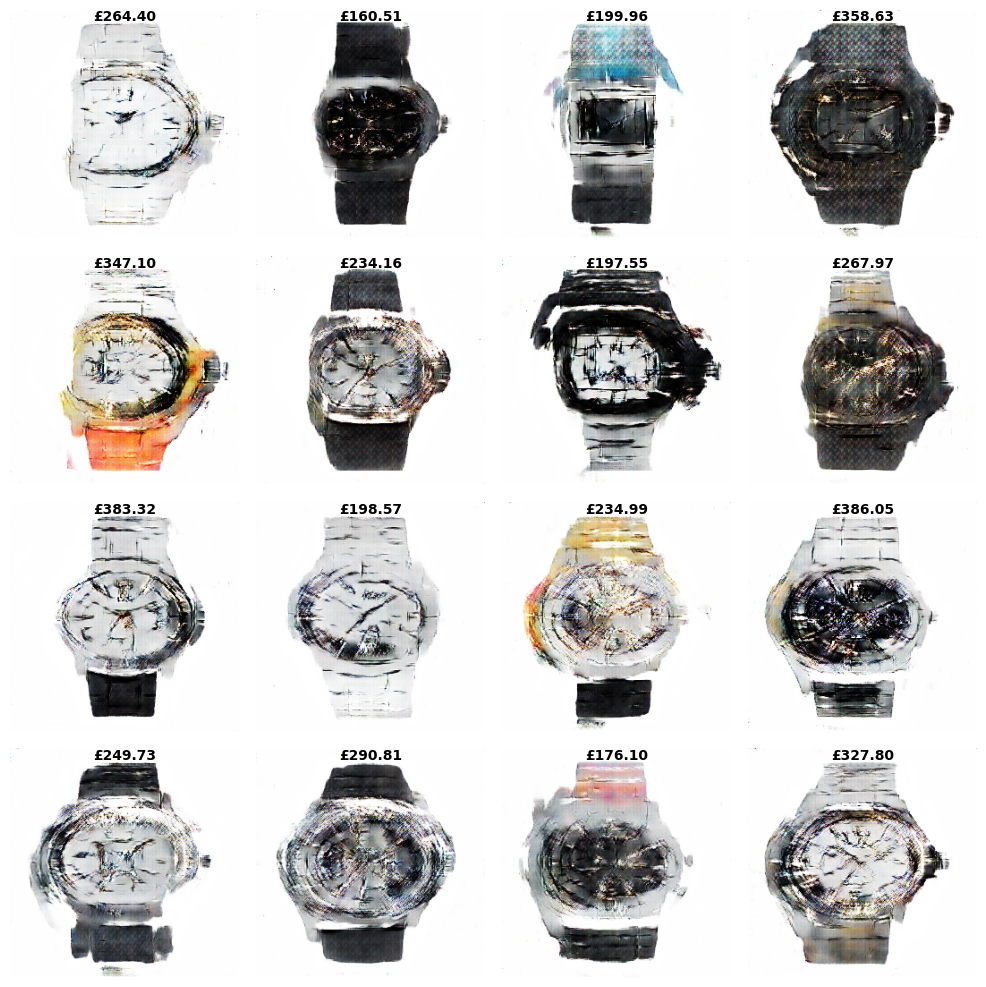

In [234]:
# Generate and display wristwatch images with prices after training
generate_and_plot_images_with_prices(generator, num_samples = 16)